In [35]:
library(gridExtra)
library(matrixStats)
library(dplyr)
library(rlang)
library(reshape2)
library(clusterCrit)
library(grid)
library(ggrepel)
library(RColorBrewer)
library(dplyr)
library(IRdisplay)
library(scales)
library(survival)
library(corrplot)
library(Hmisc)
library(ggplot2)
source('../../../src/tools.R')     # custom tools function
source('../../../src/hdp_tools_yanis.R')
source("../../../src/merge_df.R")
source("../../../src/my_toolbox.R")
source("../../../src/my_components.R")
source("../../../src/my_utils.R")
source("../../../src/ggstyles.R")
source("../../../src/my_hotspots.R")
###


theme_set(theme_minimal())

# set jupyer notebook parameters
options(repr.plot.res        = 100, # set a medium-definition resolution for the jupyter notebooks plots (DPI)
        repr.matrix.max.rows = 200, # set the maximum number of rows displayed
        repr.matrix.max.cols = 200) # set the maximum number of columns displayed

In [173]:
val=c("grey45", "#e79f00", "#009E73","#0072B2",  "#CC79A7",
        "#9ad0f3", "#D55E00", 
        "lightgoldenrod","lightskyblue","#F0E442",
        "firebrick3","#000000","#870C14","#a6bddb","mistyrose4","#fdbb84","deeppink","darkseagreen")
plot_surv <-function(fit,tmp,title="",vals=val,legend="top"){
    ggsurvplot(fit,  pval = TRUE,ggtheme = theme_minimal(),main = "Survival curve",risk.table=T,
                    risl.table.fontsize=16,
                   font.main = c(16, "bold", "darkblue"),
                   font.y = c(14, "bold.italic", "darkred"),  
                   palette = val,
                   pval.coord=c(3,1),
                   font.tickslab = c(12, "plain", "darkgreen"),
                   legend=legend,
                    title=title) 
}

In [3]:
df_final <- read.table("df_final_with_multiple_comp.tsv")


Order of Components : 
t_15_17  , inv_16  , t_8_21  , t_11  , t_6_9  , inv_3  , additions  , TP53_complex  , NPM1  , CEBPA_bi  , DNMT3A_IDH1_2  , WT1  , chr_splicing_multiple  , chr_splicing_1  , not_assigned  , no_events  ,

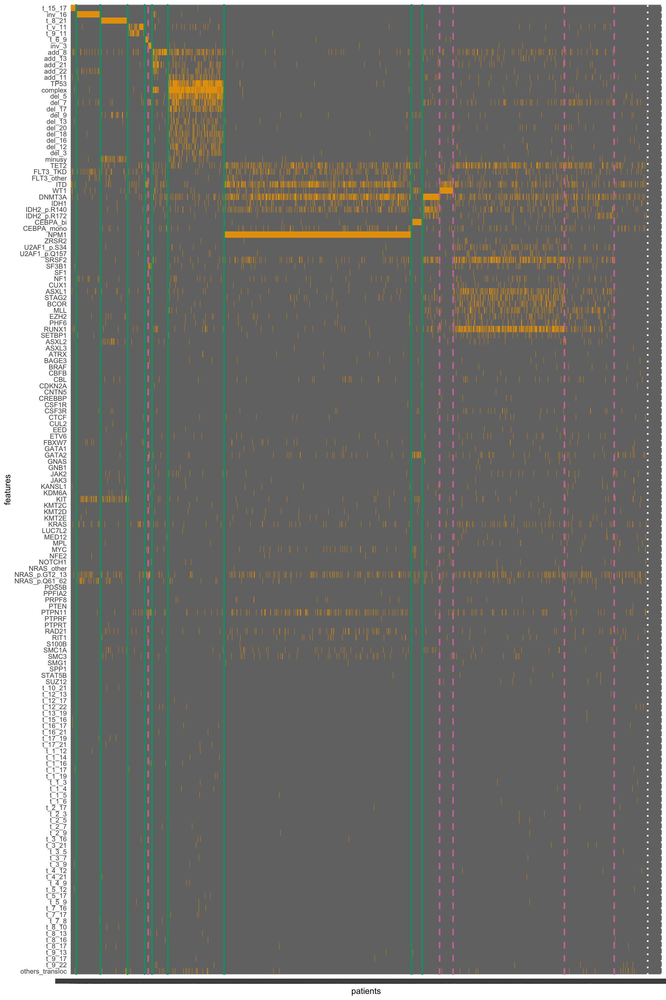

In [4]:
cols_to_keep = c(1:154,156)
splicing <-  c("ZRSR2", "U2AF1_p.S34","U2AF1_p.Q157", "SRSF2", "SF3B1", "SF1", "NF1", "CUX1")
chromatin <- c("ASXL1", "STAG2", "BCOR", "MLL", "EZH2", "PHF6")
transcriptor <- c("RUNX1","SETBP1") 
factors <- c(splicing,chromatin,transcriptor)

features_cols <- colnames(df_final[,1:154])
tmp_all <- df_final[,cols_to_keep][order(df_final[,cols_to_keep]$final_component_numeric),]
transp_df_all <-(as.data.frame(t(tmp_all)))
transp_df_all$features <- rownames(transp_df_all)
transp_df_all <- transp_df_all[! row.names(transp_df_all) == "final_component_numeric",]
col_order <- c("t_15_17","inv_16","t_8_21","t_v_11","t_9_11","t_6_9","inv_3","add_8","add_13","add_21","add_22","add_11","TP53","complex","del_5","del_7","del_17","del_9","del_13","del_20","del_18","del_16","del_12","del_3","minusy",
              "TET2","FLT3_TKD","FLT3_other","ITD","WT1","DNMT3A","IDH1","IDH2_p.R140","IDH2_p.R172","CEBPA_bi","CEBPA_mono","NPM1",factors)
col_order <- c(col_order,setdiff(features_cols,col_order))
col_order <- rev(col_order)
transp_df_all <- transp_df_all[col_order,]
melt.data_all<-melt(transp_df_all,id.vars ="features", variable_name=colnames(transp_df_all))
melt.data_all$features <- factor(melt.data_all$features,levels=col_order)  # rev because otherwise the first are at the bottom

options(repr.plot.res = 200)
set_notebook_plot_size(12, 18)
col_sep <- tabulate(df_final[,cols_to_keep]$final_component_numeric)   ## to separate by component

cat("Order of Components :","\n")
cat(paste(unique(df_final[order(df_final[,cols_to_keep]$final_component_numeric),]$final_component)," ,"))
# plot the heatmap
ggplot(melt.data_all, aes(variable,features)) +  
geom_raster(aes(fill = factor(value)), show.legend = FALSE) +
scale_fill_manual(values = c("0" = "grey45", "1" = "#e79f00")) +
#geom_vline(xintercept = cumsum(col_sep)[1:9] + 0.5, col = "#009E73", linetype = 1, size = 0.5) +
geom_vline(xintercept = cumsum(col_sep)[c(1,2,3,4,6,7,8,9,10)] + 0.5, col = "#009E73", linetype = 1, size = 1) +
geom_vline(xintercept = cumsum(col_sep)[c(5,11,12,13,14)] + 0.5, col = "#CC79A7", linetype = 2, size = 1) +
geom_vline(xintercept = cumsum(col_sep)[c(15,16)] + 0.5, col = "white", linetype = 3, size = 1) +
labs(x = 'patients')

# Analysis By Final Component

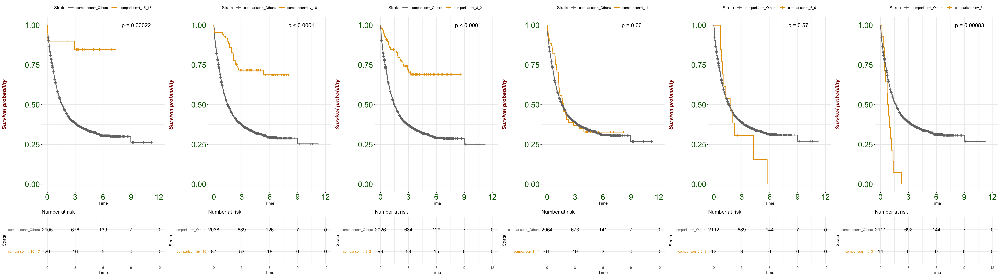

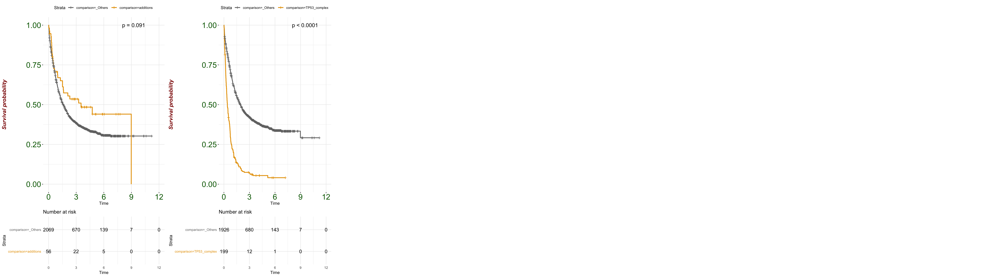

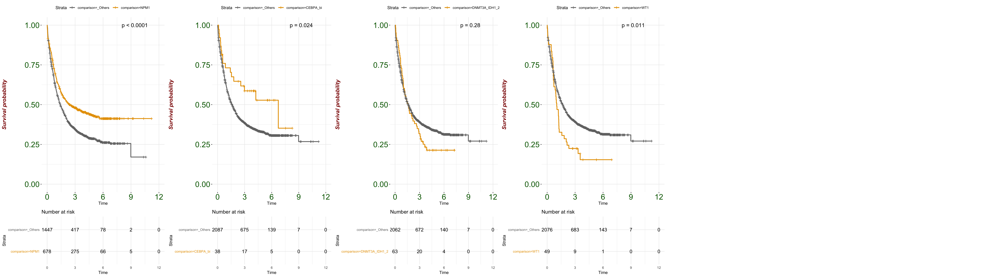

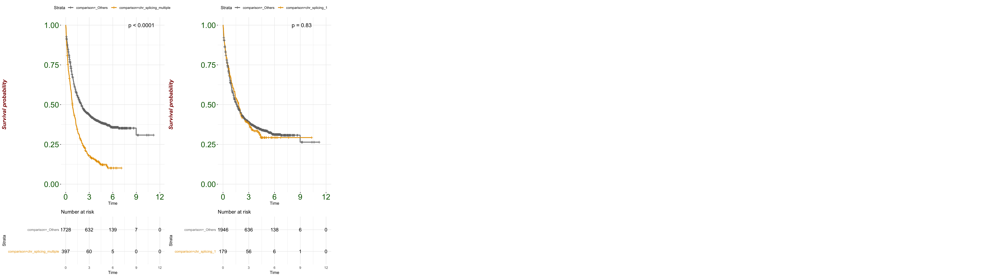

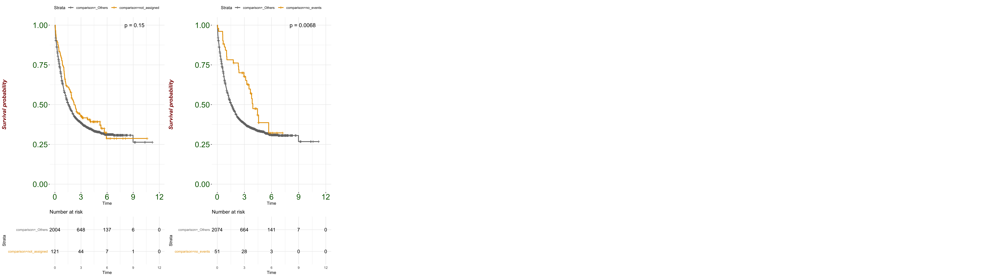

In [5]:
correlates <- c("gender","age","ahd","perf_status","bm_blasts","secondary","wbc","hb","plt","os","cr","os_status")
binary_correlates <- c("gender","ahd","perf_status","secondary","os_status","cr")
continuous_correlates <- c("age","wbc","hb","plt","bm_blasts","os")

df_initial <- read.table("../../../data/initial_dataset/Master_04_10_2019.csv",sep = ',' , header = T) 
rownames(df_initial) <- df_initial$data_pd
df_initial <- df_initial[,-1:-4]
df_w_correlates <- merge(df_initial[correlates],df_final,by=0)
rownames(df_w_correlates) <- df_w_correlates$Row.names
df_w_correlates <- df_w_correlates [,-1]
df_w_correlates <- df_w_correlates %>% filter(os > 0)
list_component <- unique(df_w_correlates[order(df_w_correlates$final_component_numeric),]$final_component)
survlist <- list()
for (i in list_component){
    tmp <- df_w_correlates
    tmp$comparison <- ifelse(tmp$final_component==i,i,"_Others") 
    surv_object <- Surv(time = tmp$os, event = tmp$os_status)
    fit <- survfit(surv_object ~ comparison, data = tmp)
    survlist[[i]]<-ggsurvplot(fit, data = tmp, pval = TRUE,ggtheme = theme_minimal(),main = "Survival curve",risk.table=T,
        risl.table.fontsize=16,
       font.main = c(16, "bold", "darkblue"),
       font.y = c(14, "bold.italic", "darkred"),  
       palette = c("grey45","#e79f00"),
       pval.coord=c(8,1),
       font.tickslab = c(20, "plain", "darkgreen"))
}
set_notebook_plot_size(36,10)
arrange_ggsurvplots(survlist[1:6],ncol=6)
arrange_ggsurvplots(survlist[7:8],ncol=6)
arrange_ggsurvplots(survlist[9:12],ncol=6)
arrange_ggsurvplots(survlist[13:14],ncol=6)
arrange_ggsurvplots(survlist[15:16],ncol=6)

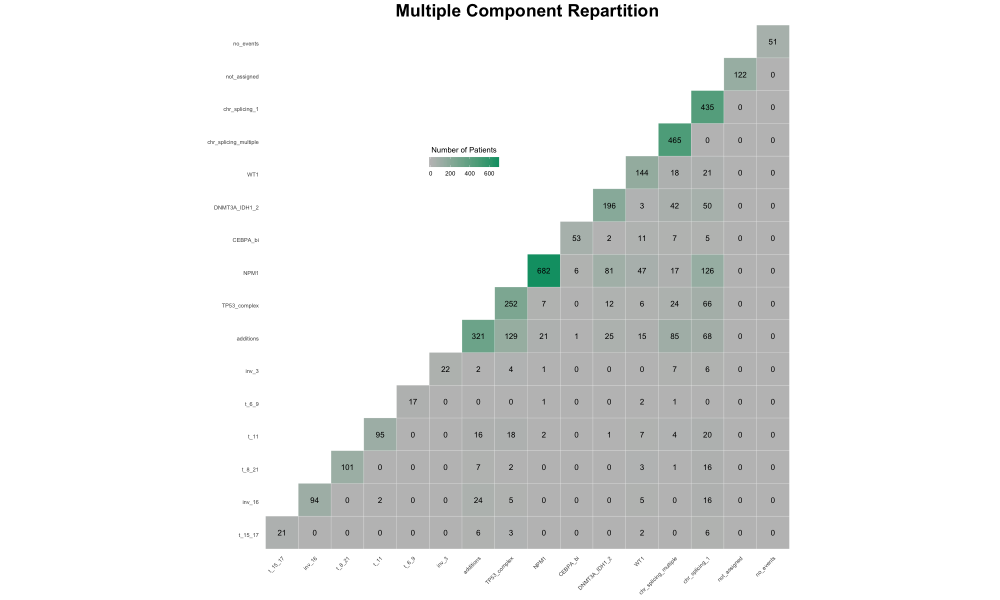

In [149]:
col_list <- colnames(df_final[,startsWith(colnames(df_final),"comp_")])
df_tmp <- setNames(data.frame(matrix(ncol = length(col_list), nrow = length(col_list))), gsub("comp_","",col_list))
rownames(df_tmp) <- gsub("comp_","",col_list)
for (col in col_list){
    for (col_bis in col_list){
        df_tmp[gsub("comp_","",col),gsub("comp_","",col_bis)] <- ifelse(is.null(dim(df_final[df_final[,col]==1 & (df_final[,col_bis]==1),])[1]),0,dim(df_final[df_final[,col]==1 & (df_final[,col_bis]==1),])[1])
    }
}

set_notebook_plot_size(20,12)
get_lower_tri<-function(cormat){
cormat[upper.tri(cormat)] <- NA
return(cormat)
}
# Get upper triangle of the correlation matrix
get_upper_tri <- function(cormat){
cormat[lower.tri(cormat)]<- NA
return(cormat)
}
upper_tri <- get_upper_tri(as.matrix(df_tmp))The 
melted_cormat <- melt(upper_tri, na.rm = TRUE)

ggplot(melted_cormat, aes(Var2, Var1, fill = value))+
geom_tile(color = "white")+
scale_fill_gradient2(low = "#0072B2", high = "#009E73", mid = "#BFBFBF", 
midpoint = 0,  space = "Lab", 
name="Number of Patients") +
theme_minimal()+ # minimal theme
theme(axis.text.x = element_text(angle = 45, vjust = 1, 
size = 8, hjust = 1),axis.text.y = element_text( vjust = 1, 
size = 8, hjust = 1))+
coord_fixed()+
geom_text(aes(Var2, Var1, label = value), color = "black", size = 4) +
theme(
axis.title.x = element_blank(),
axis.title.y = element_blank(),
panel.grid.major = element_blank(),
panel.border = element_blank(),
panel.background = element_blank(),
axis.ticks = element_blank(),
legend.justification = c(2, 0),
legend.position = c(0.6, 0.7),
legend.direction = "horizontal",
plot.title=element_text(size=25,face="bold",hjust=0.5))+
guides(fill = guide_colorbar(barwidth = 7, barheight = 1,
            title.position = "top", title.hjust = 0.5))+
ggtitle("Multiple Component Repartition")

# Analysis by Defining Features

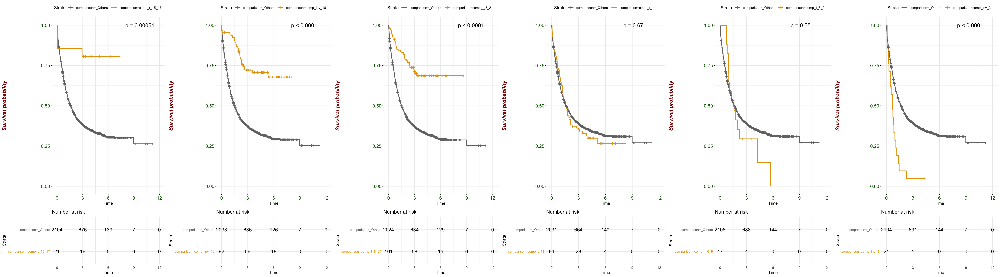

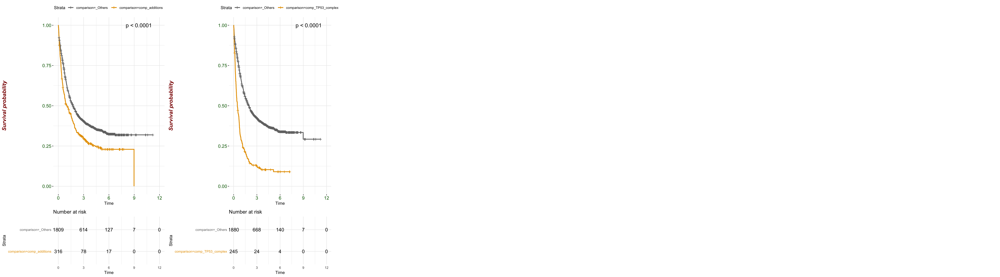

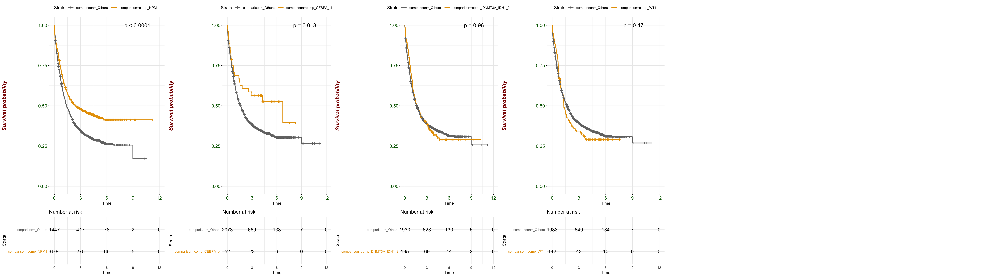

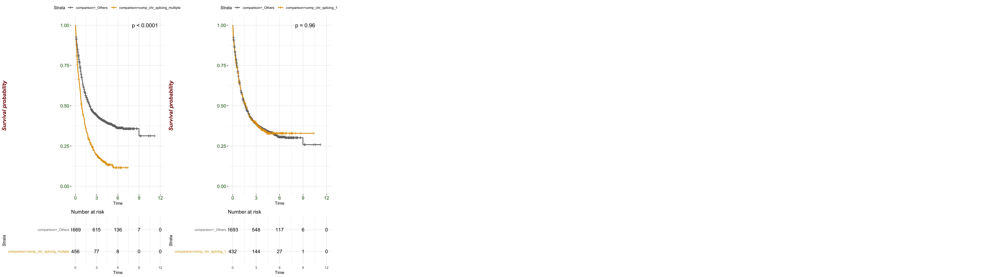

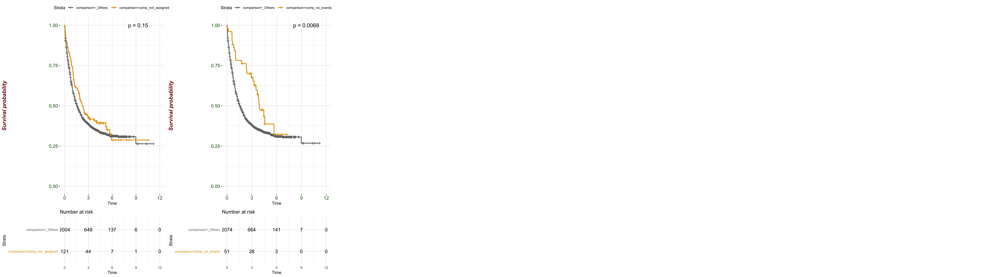

In [6]:
list_component <- colnames(df_final %>% dplyr:: select(starts_with("comp_")))
survlist <- list()
for (i in list_component){
    tmp <- df_w_correlates
    tmp$comparison <- ifelse(tmp[,i]==1,i,"_Others") 
    surv_object <- Surv(time = tmp$os, event = tmp$os_status)
    fit <- survfit(surv_object ~ comparison, data = tmp)
    survlist[[i]]<-ggsurvplot(fit, data = tmp, pval = TRUE,ggtheme = theme_minimal(),main = "Survival curve",risk.table=T,
        risl.table.fontsize=16,
       font.main = c(16, "bold", "darkblue"),
       font.y = c(14, "bold.italic", "darkred"),  
       palette = c("grey45","#e79f00"),
       pval.coord=c(8,1),
       font.tickslab = c(12, "plain", "darkgreen"))
}
set_notebook_plot_size(36,10)
arrange_ggsurvplots(survlist[1:6],ncol=6)
arrange_ggsurvplots(survlist[7:8],ncol=6)
arrange_ggsurvplots(survlist[9:12],ncol=6)
arrange_ggsurvplots(survlist[13:14],ncol=6)
arrange_ggsurvplots(survlist[15:16],ncol=6)

# Differentiation final component and defining features for each component

### Intereseting : additions ; TP53 complex ; WT1 ; chr splicing multiple

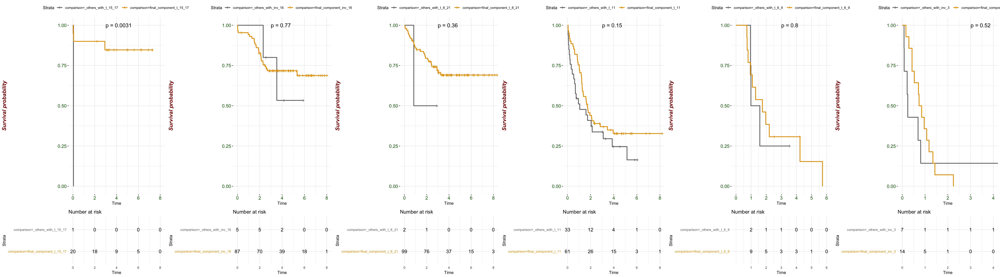

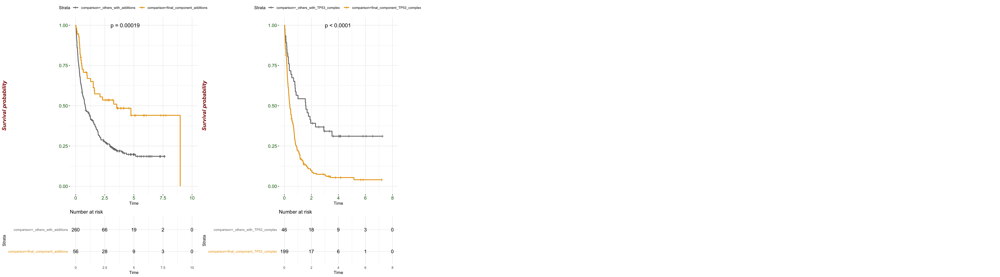

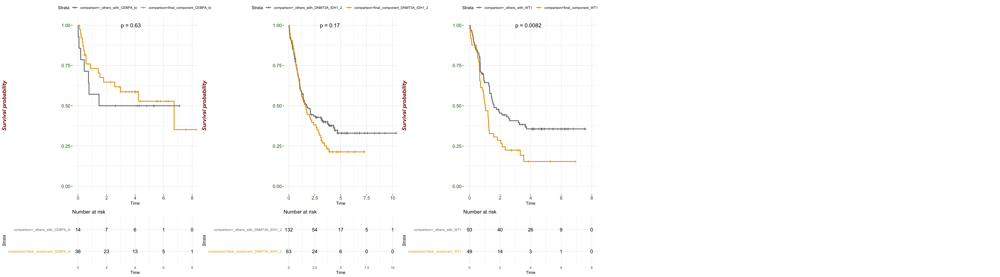

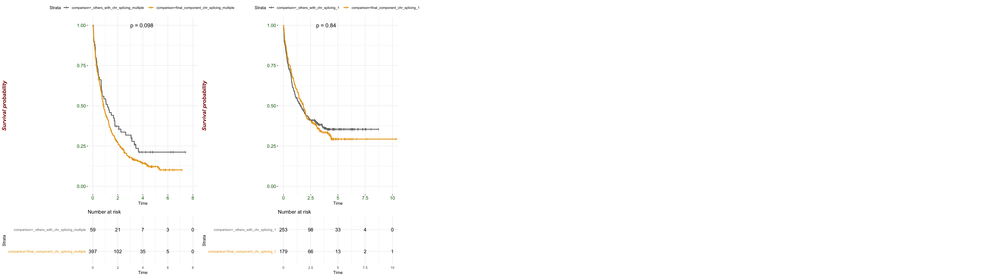

In [7]:

list_component <- colnames(df_final %>% dplyr:: select(starts_with("comp_")))
survlist <- list()
for (comps in list_component){
    if (!is.element(comps,c("comp_NPM1","comp_not_assigned","comp_no_events"))){
        tmp <- df_w_correlates[df_w_correlates[,comps]==1,]
        tmp$comparison <- ifelse(tmp$final_component==gsub("comp_","",comps),gsub("comp_","final_component_",comps),gsub("comp_","_others_with_",comps))

        surv_object <- Surv(time = tmp$os, event = tmp$os_status)
        fit <- survfit(surv_object ~ comparison, data = tmp)
        survlist[[comps]] <- ggsurvplot(fit, data = tmp, pval = TRUE,ggtheme = theme_minimal(),main = "Survival curve",risk.table=T,
            risl.table.fontsize=16,
           font.main = c(16, "bold", "darkblue"),
           font.y = c(14, "bold.italic", "darkred"),  
           palette = c("grey45","#e79f00"),
           pval.coord=c(3,1),
           font.tickslab = c(12, "plain", "darkgreen"))
            }
    }
set_notebook_plot_size(36,10)
arrange_ggsurvplots(survlist[1:6],ncol=6)
arrange_ggsurvplots(survlist[7:8],ncol=5)
arrange_ggsurvplots(survlist[9:11],ncol=5)
arrange_ggsurvplots(survlist[12:13],ncol=5)
#arrange_ggsurvplots(survlist[15:16],ncol=6)

# STRATIFICATION OF COMPONENTS BY DEFINING FEATURE COMPONENT

# NPM1 stratification by other defining features

### Whatever features we add to NPM1 lead to worse prognosis

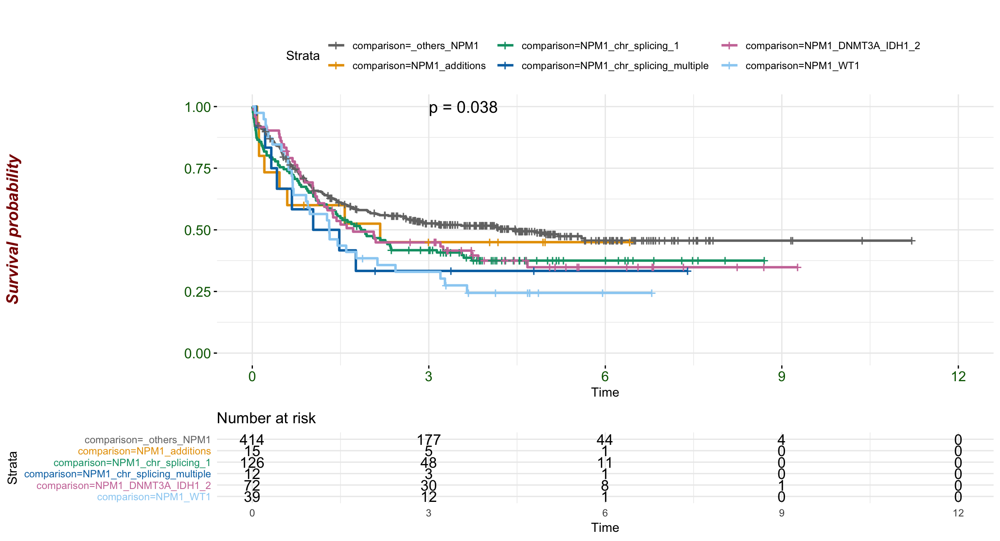

In [8]:
set_notebook_plot_size(12,6.5)
tmp <- df_w_correlates[df_w_correlates$comp_NPM1==1,]
tmp$comparison <- ifelse(tmp$comp_chr_splicing_1,"NPM1_chr_splicing_1",
                        ifelse(tmp$comp_DNMT3A_IDH1_2,"NPM1_DNMT3A_IDH1_2",
                              ifelse(tmp$comp_WT1,"NPM1_WT1",
                                    ifelse(tmp$comp_additions,"NPM1_additions",
                                          ifelse(tmp$comp_chr_splicing_multiple,"NPM1_chr_splicing_multiple","_others_NPM1")))))

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
plot_surv(fit)

# t 11 stratification

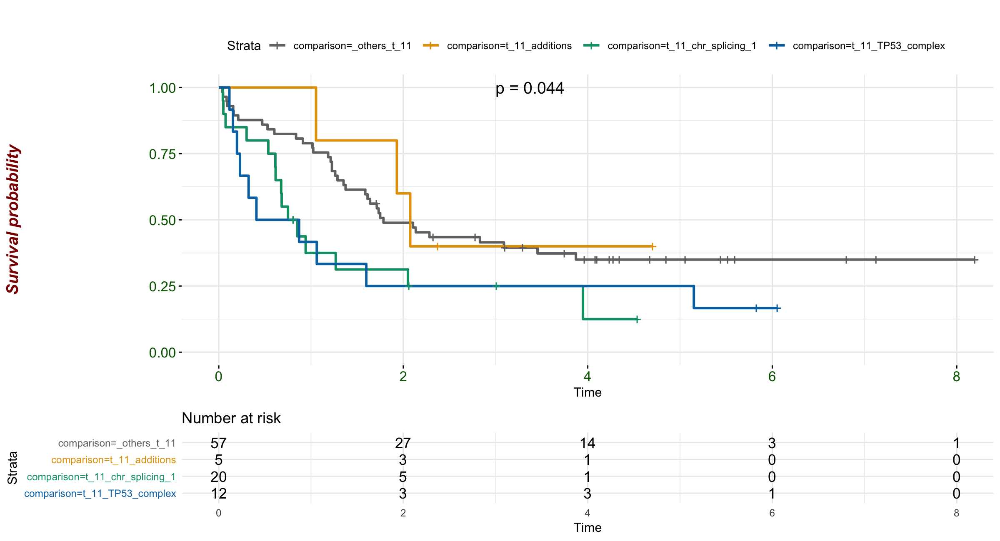

In [9]:
tmp <- df_w_correlates[df_w_correlates$comp_t_11==1,]
tmp$comparison <- ifelse(tmp$comp_chr_splicing_1,"t_11_chr_splicing_1",
                        ifelse(tmp$comp_TP53_complex,"t_11_TP53_complex",
                                ifelse(tmp$comp_additions,"t_11_additions","_others_t_11")))
                                          
surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
plot_surv(fit)

# TP53 Complex decomposition

### NICE : TP53 main driver 

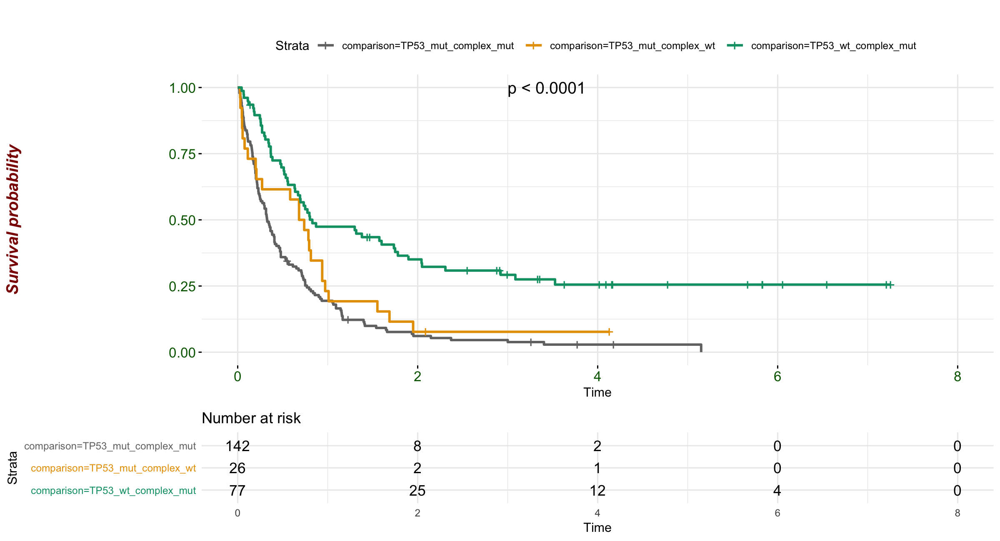

In [10]:
tmp <- df_w_correlates[df_w_correlates$comp_TP53_complex==1,]
tmp$comparison <- ifelse(tmp$TP53==1 & tmp$complex==1,"TP53_mut_complex_mut",
                        ifelse(tmp$TP53==1 & tmp$complex==0,"TP53_mut_complex_wt",
                                ifelse(tmp$TP53==0 & tmp$complex==1,"TP53_wt_complex_mut",
                                     ifelse(tmp$TP53==0 & tmp$complex==0,"TP53_wt_complex_wt","problem"))))  

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
plot_surv(fit)                                        


# TP53 complex stratification

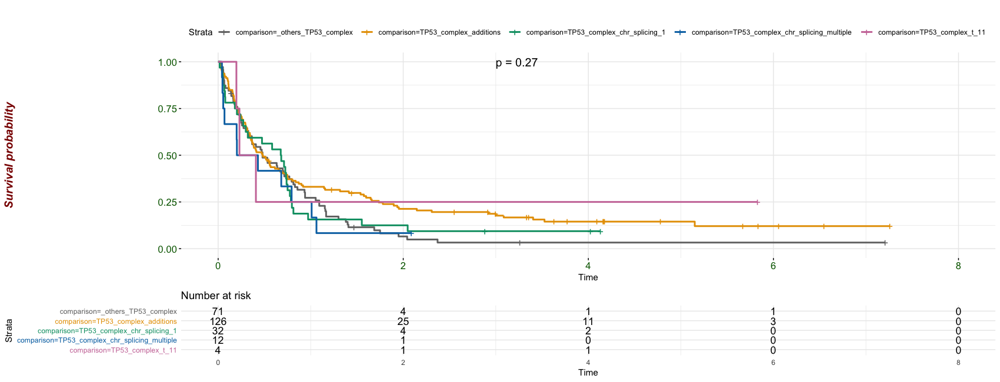

In [221]:
tmp <- df_w_correlates[df_w_correlates$comp_TP53_complex==1,]
tmp$comparison <- ifelse(tmp$comp_additions==1 ,"TP53_complex_additions",
                        ifelse(tmp$comp_chr_splicing_1==1,"TP53_complex_chr_splicing_1",
                                ifelse(tmp$comp_chr_splicing_multiple==1,"TP53_complex_chr_splicing_multiple",
                                     ifelse(tmp$comp_t_11==1,"TP53_complex_t_11","_others_TP53_complex"))))  

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,6.5)
plot_surv(fit)                                        


# Bi allelic CEBPA Stratification

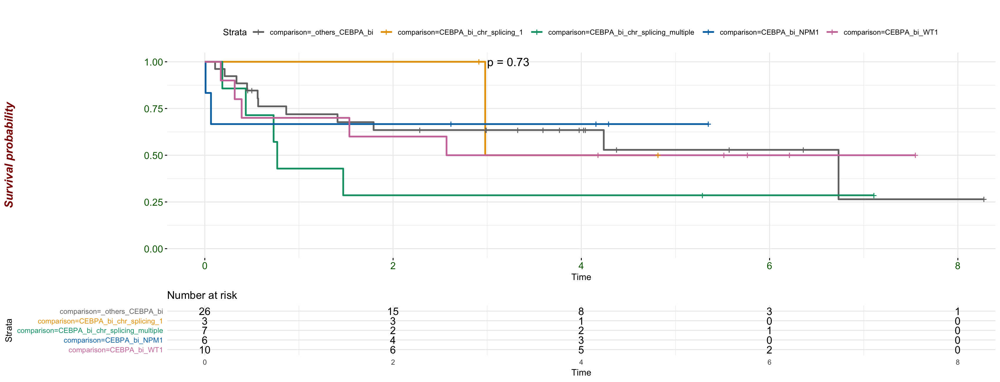

In [12]:
tmp <- df_w_correlates[df_w_correlates$comp_CEBPA_bi==1,]
tmp$comparison <- ifelse(tmp$WT1==1,"CEBPA_bi_WT1",
                        ifelse(tmp$comp_chr_splicing_multiple==1,"CEBPA_bi_chr_splicing_multiple",
                                ifelse(tmp$comp_chr_splicing_1==1,"CEBPA_bi_chr_splicing_1",
                                       ifelse(tmp$comp_NPM1==1,"CEBPA_bi_NPM1","_others_CEBPA_bi"))))

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,6.5)
plot_surv(fit)         

# Inversion 3 Stratification

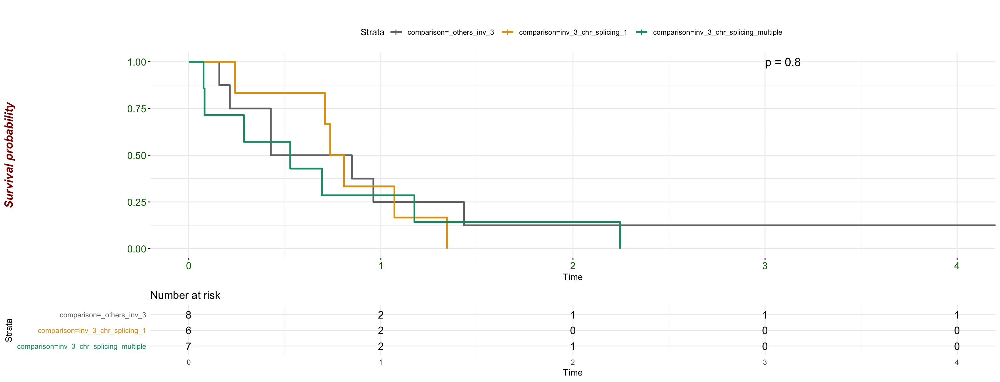

In [13]:
tmp <- df_w_correlates[df_w_correlates$comp_inv_3==1,]
tmp$comparison <- ifelse(tmp$comp_chr_splicing_multiple==1,"inv_3_chr_splicing_multiple",
                                ifelse(tmp$comp_chr_splicing_1==1,"inv_3_chr_splicing_1","_others_inv_3"))

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,6.5)
plot_surv(fit)         

# Additions Stratification

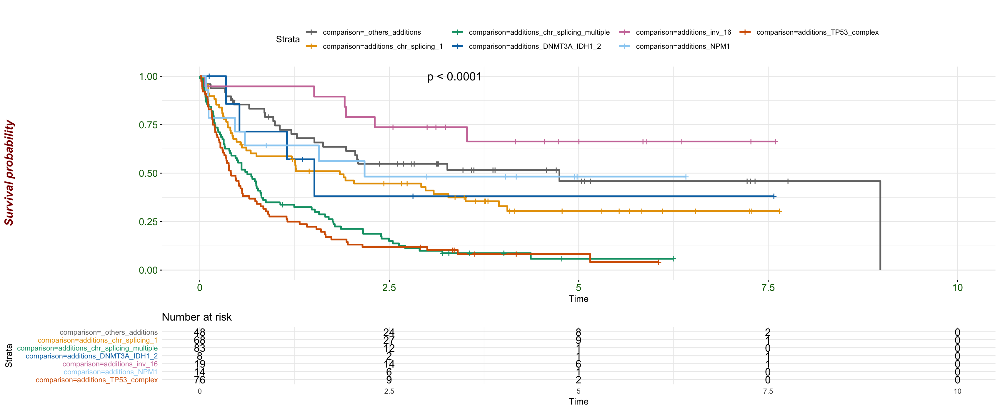

In [14]:
tmp <- df_w_correlates[df_w_correlates$comp_additions==1,]
tmp$comparison <- ifelse(tmp$comp_chr_splicing_multiple==1,"additions_chr_splicing_multiple",
                        ifelse(tmp$comp_chr_splicing_1==1,"additions_chr_splicing_1",
                              ifelse(tmp$comp_DNMT3A_IDH1_2==1,"additions_DNMT3A_IDH1_2",
                                    ifelse(tmp$comp_inv_16==1,"additions_inv_16",
                                           ifelse(tmp$comp_NPM1==1,"additions_NPM1",
                                                  ifelse(tmp$comp_TP53_complex==1,"additions_TP53_complex","_others_additions"))))))

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,7)
plot_surv(fit)         

# t_8_21 Stratification

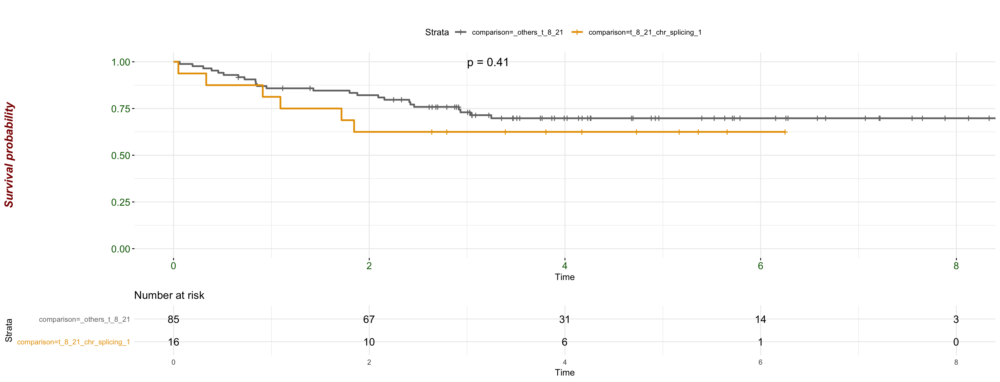

In [15]:
tmp <- df_w_correlates[df_w_correlates$comp_t_8_21==1,]
tmp$comparison <- ifelse(tmp$comp_chr_splicing_1==1,"t_8_21_chr_splicing_1","_others_t_8_21")

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,6.5)
plot_surv(fit)         

# inv_16 Stratification

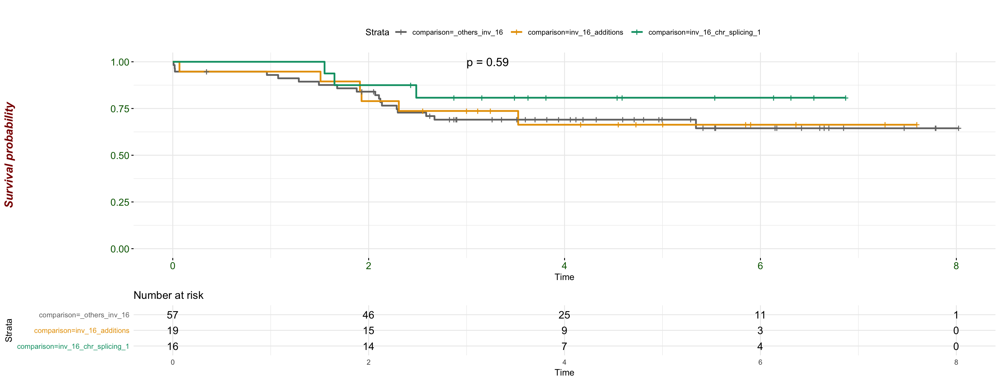

In [16]:
tmp <- df_w_correlates[df_w_correlates$comp_inv_16==1,]
tmp$comparison <- ifelse(tmp$comp_chr_splicing_1==1,"inv_16_chr_splicing_1",
                         ifelse(tmp$comp_additions==1,"inv_16_additions","_others_inv_16"))

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,6.5)
plot_surv(fit)         

# t_15_17 Stratification

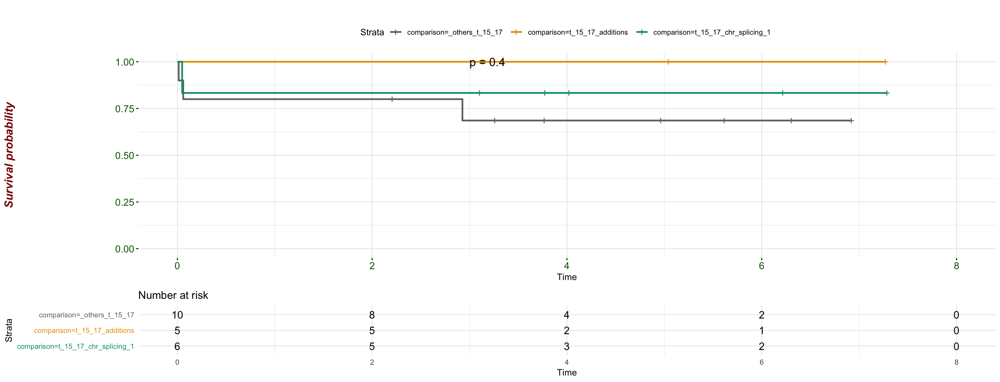

In [17]:
tmp <- df_w_correlates[df_w_correlates$comp_t_15_17==1,]
tmp$comparison <- ifelse(tmp$comp_chr_splicing_1==1,"t_15_17_chr_splicing_1",
                         ifelse(tmp$comp_additions==1,"t_15_17_additions","_others_t_15_17"))

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,6.5)
plot_surv(fit)         

# Chr splicing multiple Stratification

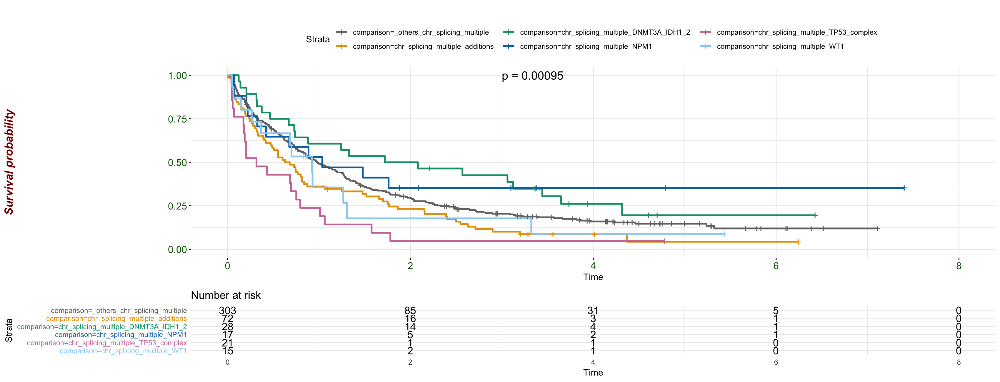

In [18]:
tmp <- df_w_correlates[df_w_correlates$comp_chr_splicing_multiple==1,]
tmp$comparison <- ifelse(tmp$comp_NPM1==1,"chr_splicing_multiple_NPM1",
                         ifelse(tmp$comp_TP53_complex==1,"chr_splicing_multiple_TP53_complex",
                             ifelse(tmp$comp_additions==1,"chr_splicing_multiple_additions",
                                    ifelse(tmp$comp_WT1==1,"chr_splicing_multiple_WT1",
                                          ifelse(tmp$comp_DNMT3A_IDH1_2==1,"chr_splicing_multiple_DNMT3A_IDH1_2","_others_chr_splicing_multiple")))))
                        

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,6.5)
plot_surv(fit)         

# Chr splicing 1 Stratification

### Chr Splicing 1 with inv 16  does quite well ; really bad with transloc(11)

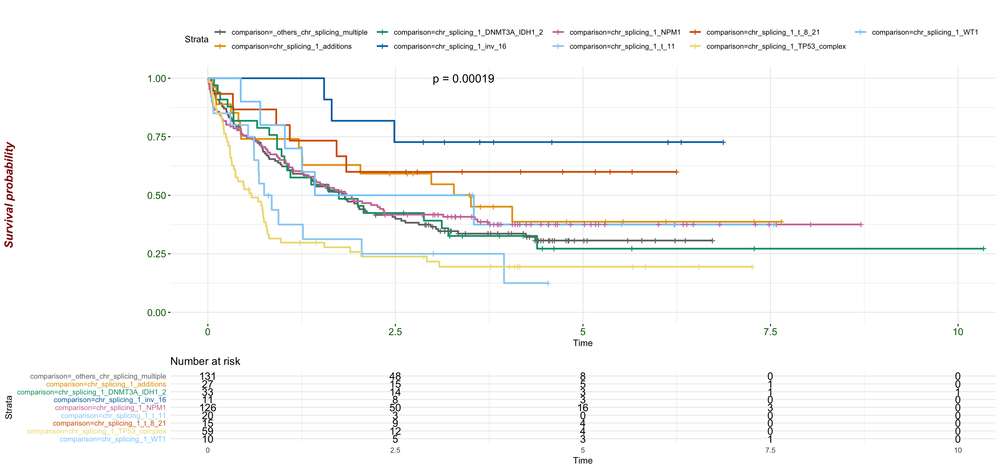

In [19]:
tmp <- df_w_correlates[df_w_correlates$comp_chr_splicing_1==1,]
tmp$comparison <- ifelse(tmp$comp_NPM1==1,"chr_splicing_1_NPM1",
                         ifelse(tmp$comp_t_11==1,"chr_splicing_1_t_11",
                             ifelse(tmp$comp_TP53_complex==1,"chr_splicing_1_TP53_complex",
                                 ifelse(tmp$comp_additions==1,"chr_splicing_1_additions",
                                        ifelse(tmp$comp_t_8_21==1,"chr_splicing_1_t_8_21",
                                               ifelse(tmp$comp_additions==1,"chr_splicing_1_additions",
                                                      ifelse(tmp$comp_inv_16==1,"chr_splicing_1_inv_16", 
                                                            ifelse(tmp$comp_WT1==1,"chr_splicing_1_WT1",
                                                                  ifelse(tmp$comp_DNMT3A_IDH1_2==1,"chr_splicing_1_DNMT3A_IDH1_2","_others_chr_splicing_multiple")))))))))
                        

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,8)
plot_surv(fit)         

# WT1 Stratification

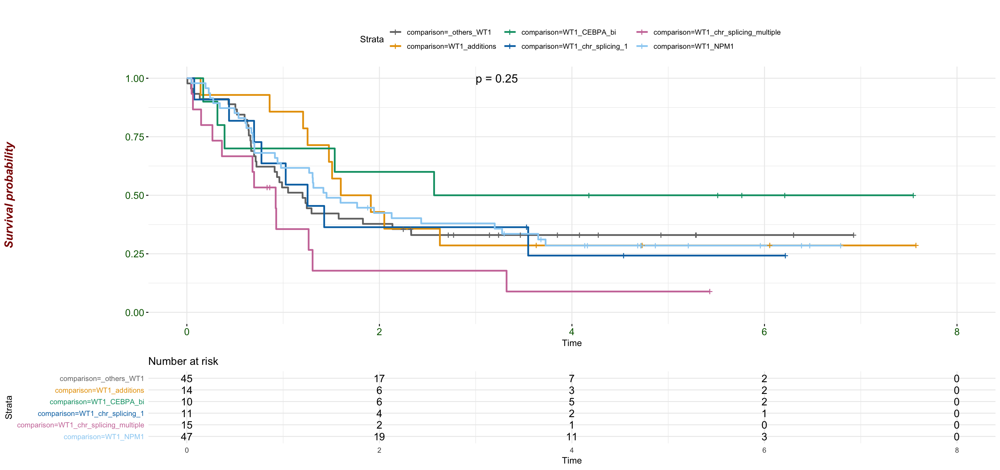

In [20]:
tmp <- df_w_correlates[df_w_correlates$comp_WT1==1,]
tmp$comparison <- ifelse(tmp$comp_NPM1==1,"WT1_NPM1",
                         ifelse(tmp$comp_CEBPA_bi==1,"WT1_CEBPA_bi",
                                ifelse(tmp$comp_additions==1,"WT1_additions",
                                        ifelse(tmp$comp_chr_splicing_multiple==1,"WT1_chr_splicing_multiple",
                                               ifelse(tmp$comp_chr_splicing_1==1,"WT1_chr_splicing_1","_others_WT1")))))
                        

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,8)
plot_surv(fit)         

# DNMT3A IDH1_2 Decomposition

### DNMT3A IDH2 R172 does better than R140

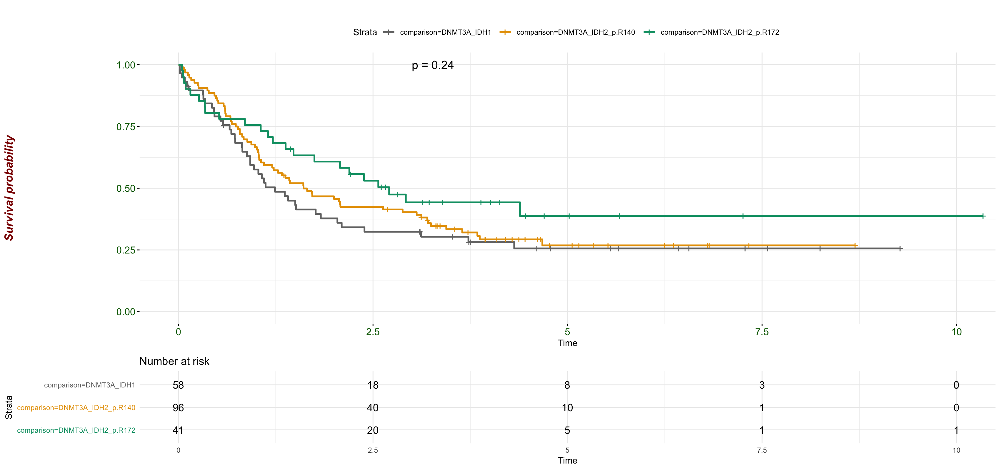

In [21]:
tmp <- df_w_correlates[df_w_correlates$comp_DNMT3A_IDH1_2==1,]
tmp$comparison <- ifelse(tmp$IDH1==1,"DNMT3A_IDH1",
                         ifelse(tmp$IDH2_p.R140==1,"DNMT3A_IDH2_p.R140",
                                ifelse(tmp$IDH2_p.R172==1,"DNMT3A_IDH2_p.R172","???")))

                        

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,8)
plot_surv(fit)         

# DNMT3A_IDH1_2 Stratification

### INTERESTING COMBINATION : TP53 COMPLEX with DNMT3A IDH DO QUITE WELL 

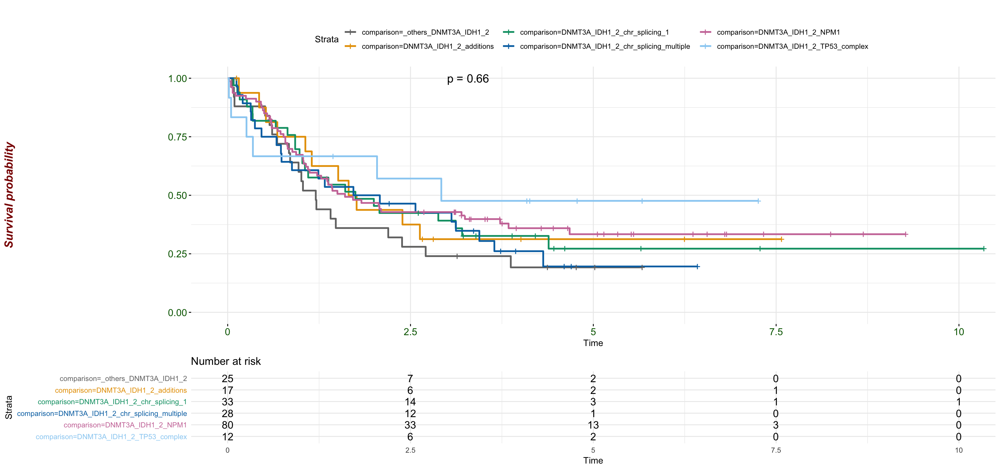

In [22]:
tmp <- df_w_correlates[df_w_correlates$comp_DNMT3A_IDH1_2==1,]
tmp$comparison <- ifelse(tmp$comp_NPM1==1,"DNMT3A_IDH1_2_NPM1",
                         ifelse(tmp$comp_TP53_complex==1,"DNMT3A_IDH1_2_TP53_complex",
                                ifelse(tmp$comp_additions==1,"DNMT3A_IDH1_2_additions",
                                        ifelse(tmp$comp_chr_splicing_multiple==1,"DNMT3A_IDH1_2_chr_splicing_multiple",
                                               ifelse(tmp$comp_chr_splicing_1==1,"DNMT3A_IDH1_2_chr_splicing_1","_others_DNMT3A_IDH1_2")))))
                        

surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,8)
plot_surv(fit)         

# Detailed analysis of chromatin splicing :

In [24]:
tmp_ana <- data.frame(rbind(t(100*colSums(df_w_correlates[df_w_correlates$comp_chr_splicing_1==1,factors])/dim(df_w_correlates[df_w_correlates$comp_chr_splicing_1==1,])[1]),
                            t(100*colSums(df_w_correlates[df_w_correlates$comp_chr_splicing_multiple==1,factors])/dim(df_w_correlates[df_w_correlates$comp_chr_splicing_multiple==1,])[1])))
tmp_ana$comp <- c("chr_splicing_1 (freq %)","chr_splicing_multiple (freq %)")

ZRSR2,U2AF1_p.S34,U2AF1_p.Q157,SRSF2,SF3B1,SF1,NF1,CUX1,ASXL1,STAG2,BCOR,MLL,EZH2,PHF6,RUNX1,SETBP1,comp
0.6944444,3.703704,0.9259259,22.68519,6.712963,0.9259259,9.490741,1.388889,8.564815,6.944444,3.703704,8.101852,7.407407,3.703704,13.19444,1.851852,chr_splicing_1 (freq %)
3.9473684,11.403509,6.7982456,44.73684,7.675439,0.2192982,7.236842,4.824561,28.508772,21.929825,17.543860,18.859649,10.964912,10.307018,56.14035,7.236842,chr_splicing_multiple (freq %)


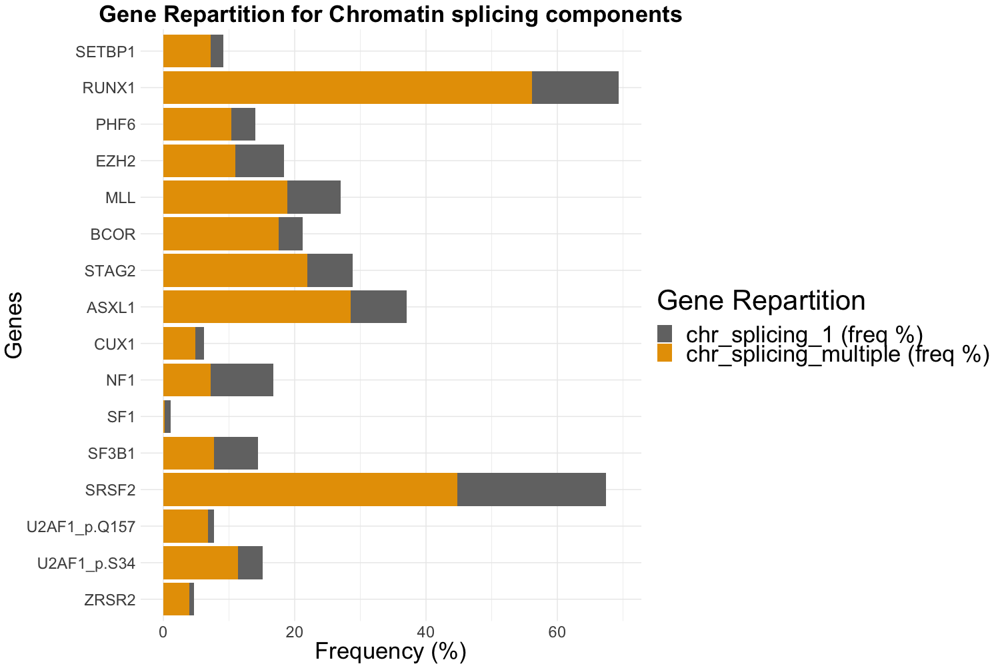

In [184]:
tmp_ana
d <- melt(tmp_ana,id.vars = "comp")
set_notebook_plot_size(15,10)
ggplot(d,aes(x = variable,y = value,fill=comp)) + 
geom_bar(aes(fill = comp),stat = "identity") +scale_fill_manual(values=val)+
scale_y_continuous(breaks = function(x) unique(floor(pretty(seq(0, (max(x) + 1) * 1.1)))))+
labs(fill='Gene Repartition') +ggtitle("Gene Repartition for Chromatin splicing components")+
theme(axis.text.x=element_text(size=17),axis.title.x = element_text(size=25),axis.text.y=element_text(size=17),axis.title.y = element_text(size=25),legend.text = element_text(size=25),legend.title = element_text(size=30),
      plot.title = element_text(size=25,face="bold",hjust=0.5))+coord_flip()+
                   ylab("Frequency (%)")+xlab("Genes")
                   
                   
                   

# Chr Splicing 1 stratified

### Interesting : SF3B1 , ~(ZRSR2 and U2AF1-157) doing really bad &  NF1 doing really well

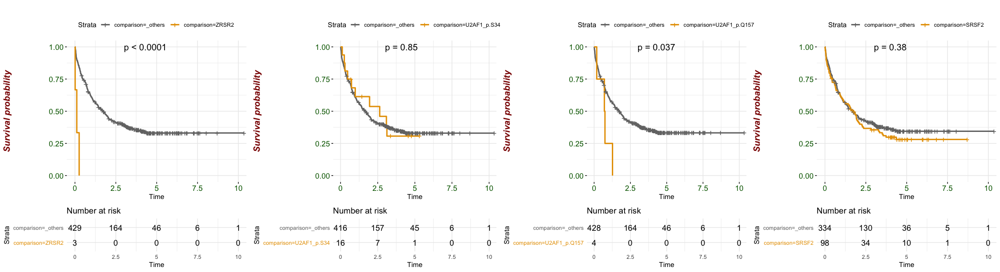

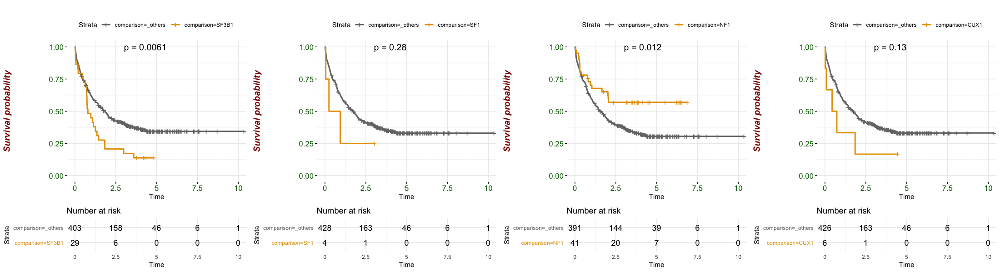

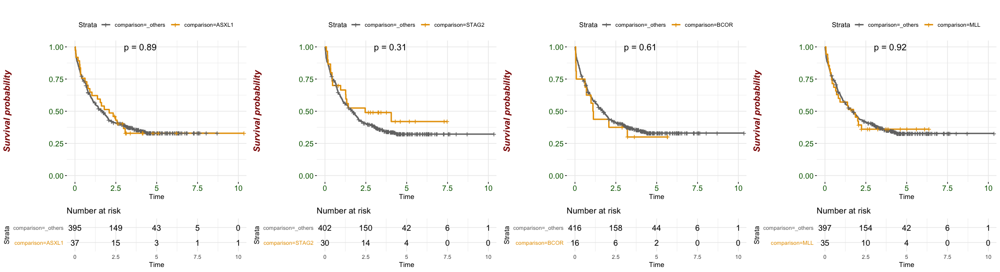

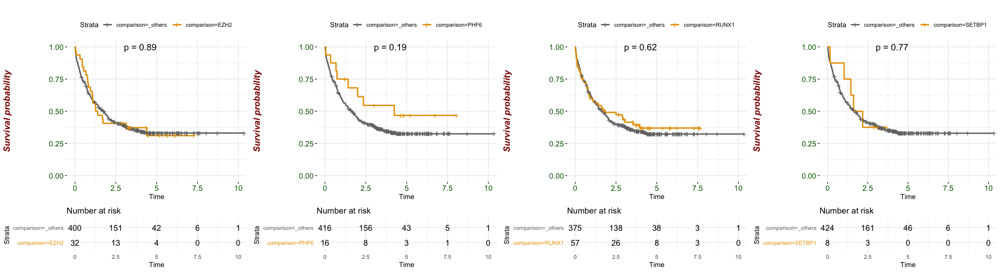

In [139]:
tmp <- df_w_correlates[df_w_correlates$comp_chr_splicing_1==1,]
survlist <- list()
for (fac in factors){    
    tmp$comparison <- ifelse(tmp[,fac]==1 ,fac,"_others")
    surv_object <- Surv(time = tmp$os, event = tmp$os_status)
    fit <- survfit(surv_object ~ comparison, data = tmp)
    survlist[[fac]] <- plot_surv(fit)
}

#fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(22,6)
arrange_ggsurvplots(survlist[1:4],ncol=4)
arrange_ggsurvplots(survlist[5:8],ncol=4)
arrange_ggsurvplots(survlist[9:12],ncol=4)
arrange_ggsurvplots(survlist[13:16],ncol=4)

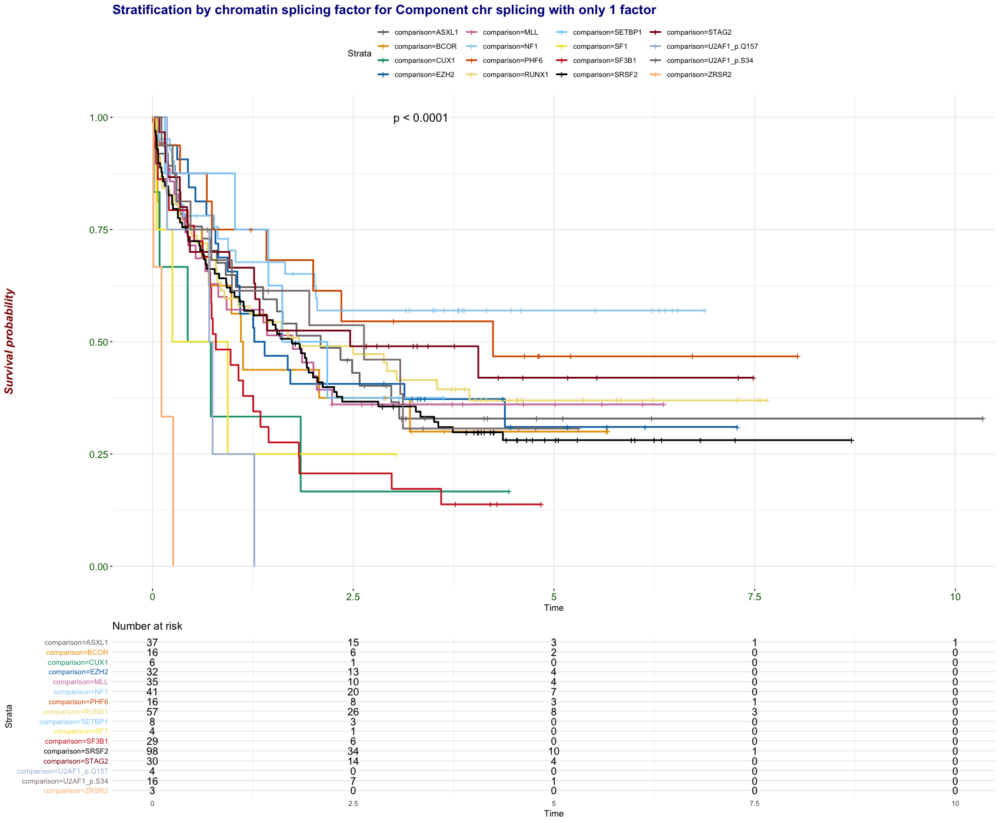

In [140]:
tmp <- df_w_correlates[df_w_correlates$comp_chr_splicing_1==1,]
tmp$comparison <- 0
for (fac in factors){    
    tmp[tmp$comparison==0 & tmp[,fac]==1,]$comparison <- fac
}
surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,14)
plot_surv(fit,title="Stratification by chromatin splicing factor for Component chr splicing with only 1 factor")   

# Zoom 1 Chromatin splicing factors

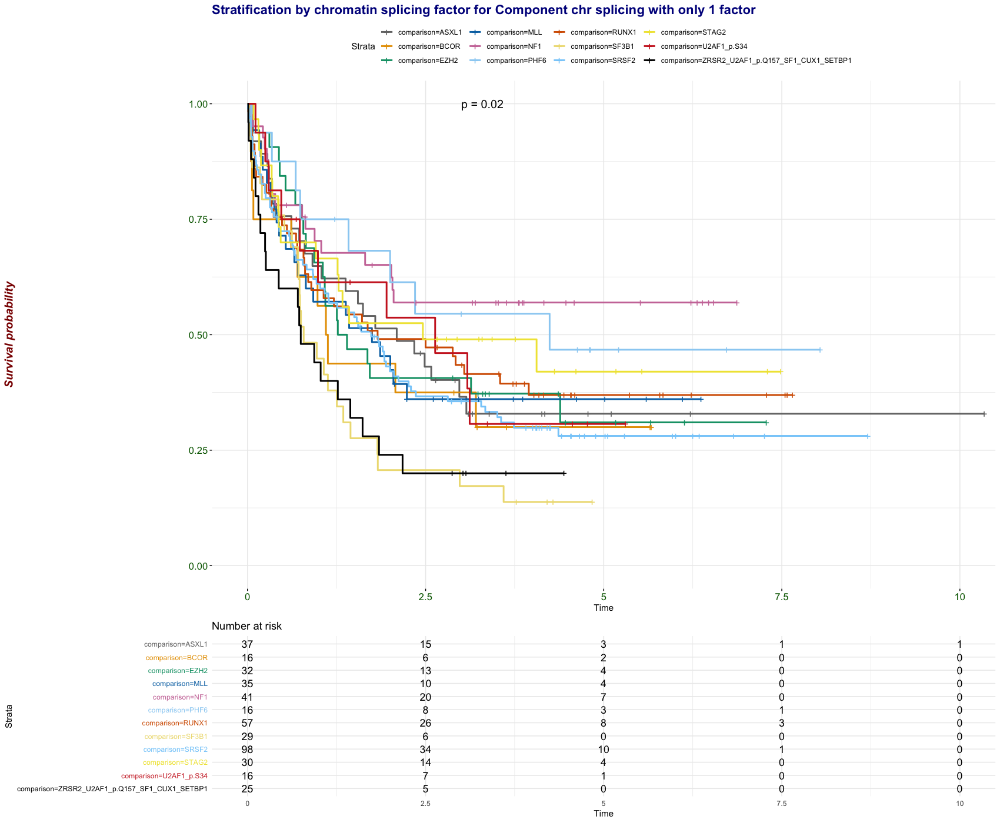

In [141]:

tmp <- df_w_correlates[df_w_correlates$comp_chr_splicing_1==1,]
zoom_factors <- c("U2AF1_p.S34","SRSF2","SF3B1","ASXL1","STAG2","BCOR","RUNX1","EZH2","MLL","PHF6","NF1")
tmp$comparison <- "ZRSR2_U2AF1_p.Q157_SF1_CUX1_SETBP1"
for (fac in zoom_factors){    
    tmp[tmp$comparison=="ZRSR2_U2AF1_p.Q157_SF1_CUX1_SETBP1" & tmp[,fac]==1,]$comparison <- fac
}
surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,14)
plot_surv(fit,title="Stratification by chromatin splicing factor for Component chr splicing with only 1 factor")   

# Zoom 2 Chromatin splicing factors

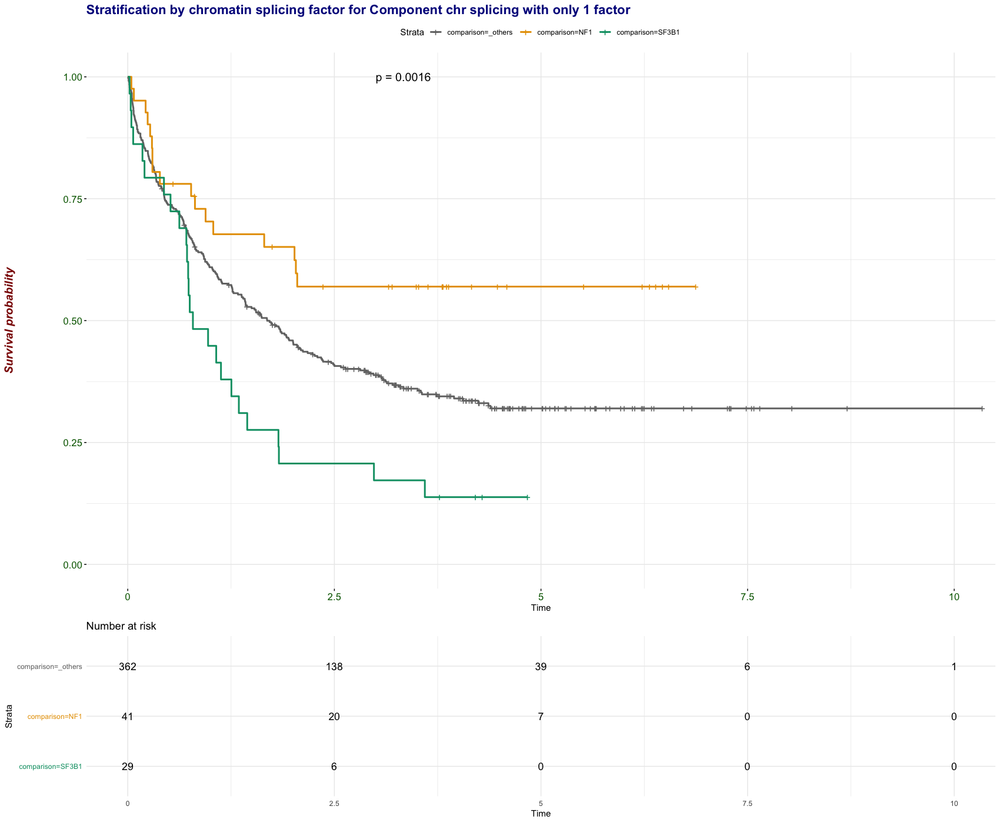

In [142]:

tmp <- df_w_correlates[df_w_correlates$comp_chr_splicing_1==1,]
zoom_factors <- c("NF1","SF3B1")
tmp$comparison <- "_others"
for (fac in zoom_factors){    
    tmp[tmp$comparison=="_others" & tmp[,fac]==1,]$comparison <- fac
}
surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,14)
plot_surv(fit,title="Stratification by chromatin splicing factor for Component chr splicing with only 1 factor")   

# Chromatin vs splicing vs transcriptor

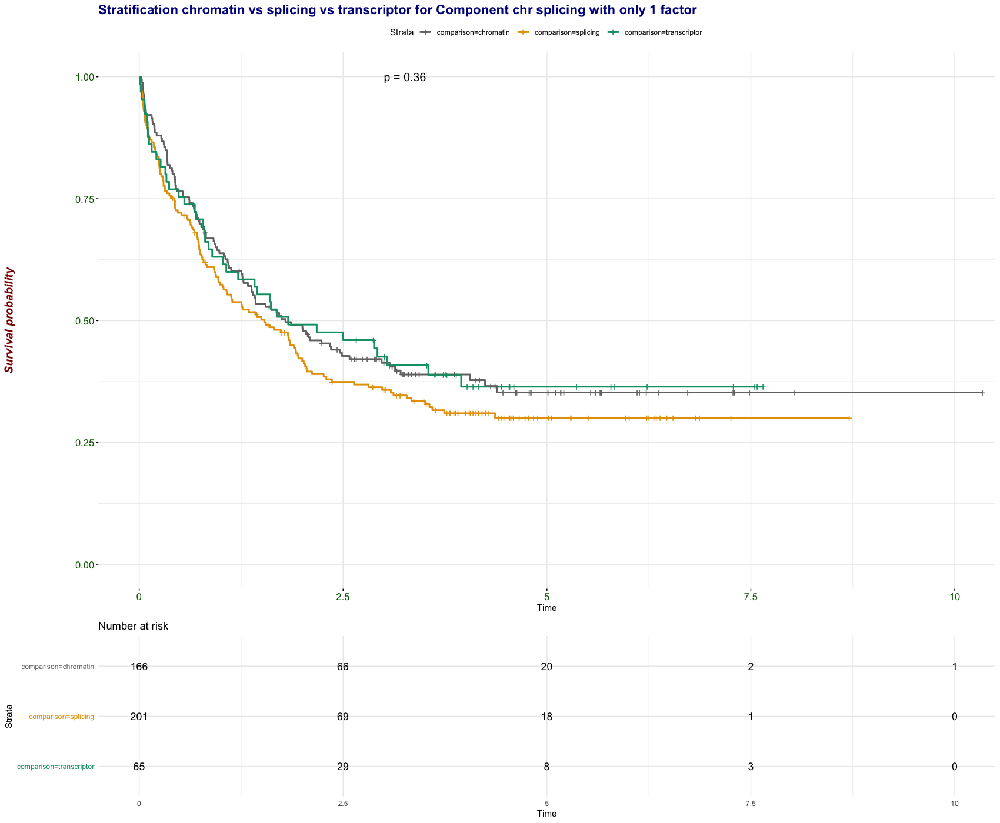

In [143]:
tmp <- df_w_correlates[df_w_correlates$comp_chr_splicing_1==1,]

tmp$comparison <- 0
tmp[rowSums(tmp[,splicing])>0,]$comparison <- "splicing"
tmp[rowSums(tmp[,chromatin])>0,]$comparison <- "chromatin"
tmp[rowSums(tmp[,transcriptor])>0,]$comparison <- "transcriptor"
surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(17,14)
plot_surv(fit,title="Stratification chromatin vs splicing vs transcriptor for Component chr splicing with only 1 factor")   

# Chr Splicing multiple Analysis

In [144]:
tmp <-df_w_correlates[df_w_correlates$comp_chr_splicing_multiple==1,]  ### important to use this
df_fac <- setNames(data.frame(matrix(ncol = length(factors), nrow = length(factors))), factors)
rownames(df_fac) <- factors
for (col in factors){
    for (col_bis in factors){
        df_fac[col,col_bis] <- ifelse(is.null(dim(tmp[tmp[,col]==1 & (tmp[,col_bis]==1),])[1]),0,dim(tmp[tmp[,col]==1 & (tmp[,col_bis]==1),])[1])
    }
}


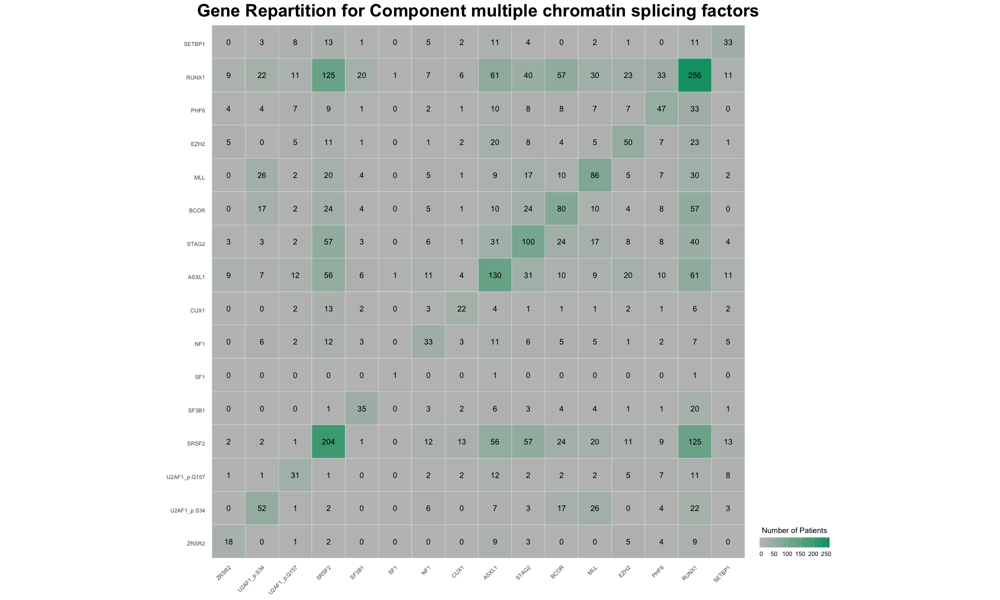

In [177]:
set_notebook_plot_size(20,12)
get_lower_tri<-function(cormat){
cormat[upper.tri(cormat)] <- NA
return(cormat)
}
# Get upper triangle of the correlation matrix
get_upper_tri <- function(cormat){
cormat[lower.tri(cormat)]<- NA
return(cormat)
}
upper_tri <- get_upper_tri(as.matrix(df_fac))
melted_cormat <- melt(as.matrix(df_fac), na.rm = TRUE)

ggplot(melted_cormat, aes(Var2, Var1, fill = value))+
geom_tile(color = "white")+
scale_fill_gradient2(low = "#0072B2", high = "#009E73", mid = "#BFBFBF", 
midpoint = 0,  space = "Lab", 
name="Number of Patients") +
theme_minimal()+ # minimal theme
theme(axis.text.x = element_text(angle = 45, vjust = 1, 
size = 8, hjust = 1),axis.text.y = element_text( vjust = 1, 
size = 8, hjust = 1))+
coord_fixed()+
geom_text(aes(Var2, Var1, label = value), color = "black", size = 4) +
theme(
axis.title.x = element_blank(),
axis.title.y = element_blank(),
panel.grid.major = element_blank(),
panel.border = element_blank(),
panel.background = element_blank(),
axis.ticks = element_blank(),
legend.justification = c(2, 0),
#legend.position = c(0.6, 0.7),
legend.direction = "horizontal",
plot.title=element_text(size=25,face="bold",hjust=0.5))+
guides(fill = guide_colorbar(barwidth = 7, barheight = 1,
            title.position = "top", title.hjust = 0.5))+
ggtitle("Gene Repartition for Component multiple chromatin splicing factors")

# Interesting :Comparison for  chr splicing factors multiple vs 1 for each gene

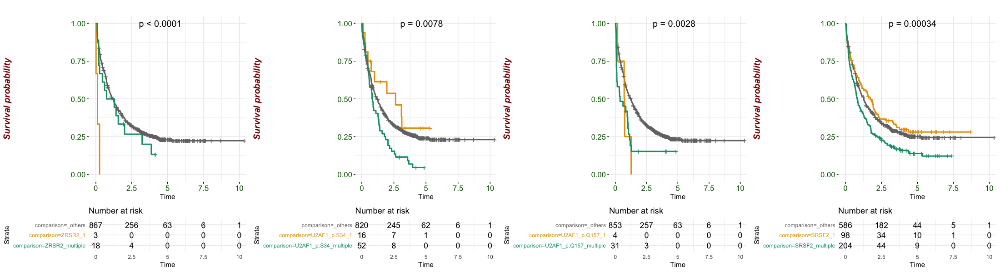

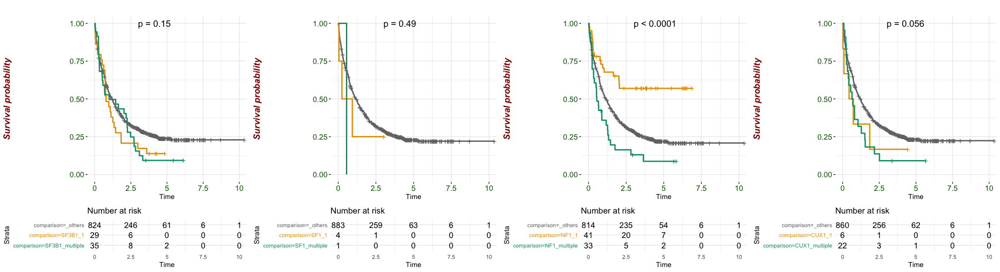

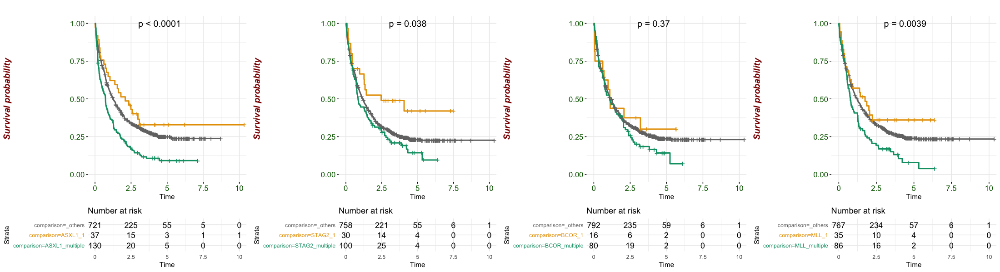

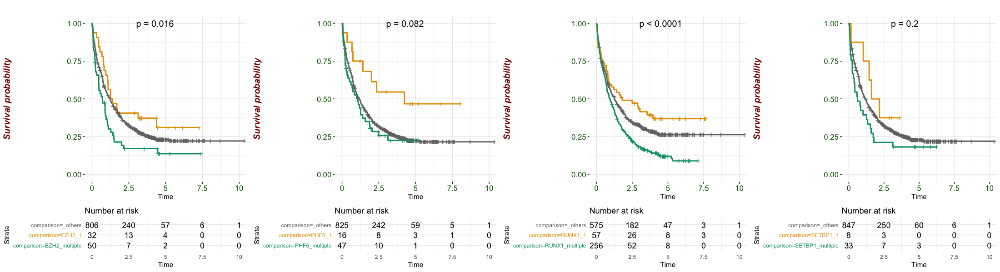

In [186]:
set_notebook_plot_size(50,6)
tmp <- df_w_correlates[(df_w_correlates$comp_chr_splicing_1==1) | (df_w_correlates$comp_chr_splicing_multiple==1),]
tmp$comparison <- 0
survlist <- list()
for (fac in factors){    
    tmp$comparison <- ifelse(tmp[,fac]==1 & tmp$comp_chr_splicing_1==1 ,paste(fac,"1",sep="_"),
                             ifelse(tmp[,fac]==1 & tmp$comp_chr_splicing_multiple==1 ,paste(fac,"multiple",sep="_"),"_others"))
    surv_object <- Surv(time = tmp$os, event = tmp$os_status)
    fit <- survfit(surv_object ~ comparison, data = tmp)
    survlist[[fac]] <- plot_surv(fit,legend="none")
}

#fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(22,6)
arrange_ggsurvplots(survlist[1:4],ncol=4)
arrange_ggsurvplots(survlist[5:8],ncol=4)
arrange_ggsurvplots(survlist[9:12],ncol=4)
arrange_ggsurvplots(survlist[13:16],ncol=4)

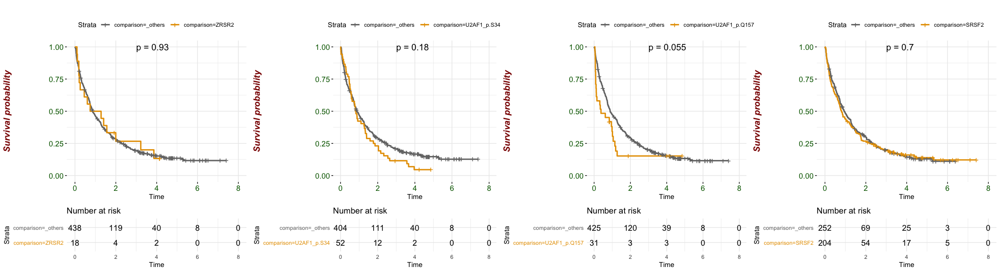

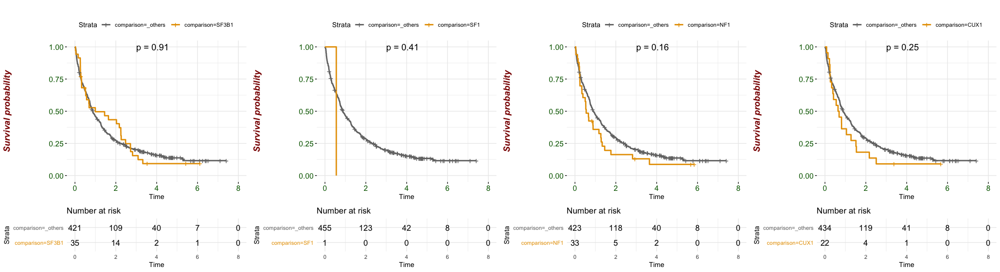

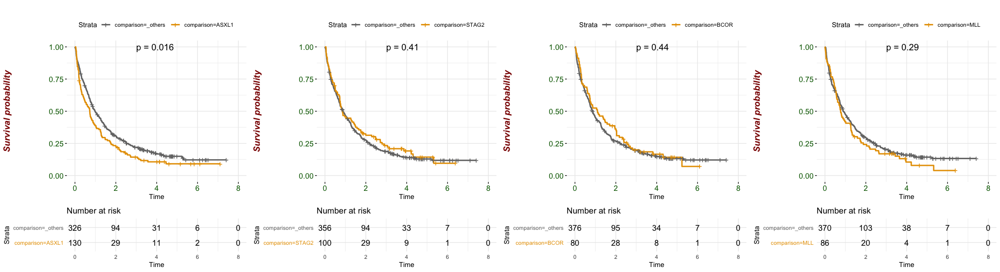

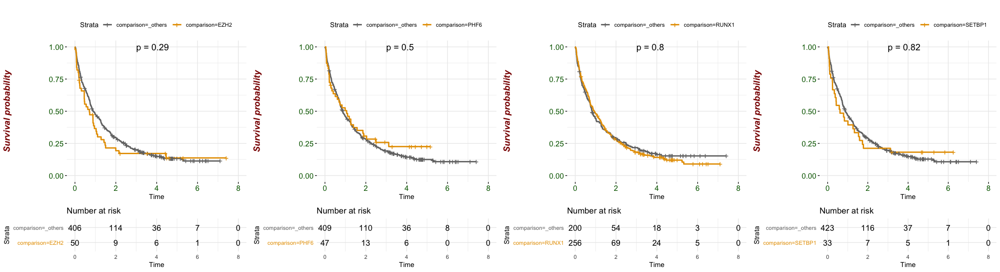

In [147]:
tmp <- df_w_correlates[df_w_correlates$comp_chr_splicing_multiple==1,]
survlist <- list()
for (fac in factors){    
    tmp$comparison <- ifelse(tmp[,fac]==1 ,fac,"_others")
    surv_object <- Surv(time = tmp$os, event = tmp$os_status)
    fit <- survfit(surv_object ~ comparison, data = tmp)
    survlist[[fac]] <- plot_surv(fit)
}

#fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(22,6)
arrange_ggsurvplots(survlist[1:4],ncol=4)
arrange_ggsurvplots(survlist[5:8],ncol=4)
arrange_ggsurvplots(survlist[9:12],ncol=4)
arrange_ggsurvplots(survlist[13:16],ncol=4)


# Comutations survival analysis for chromatin splicing multiple

# SRSF2

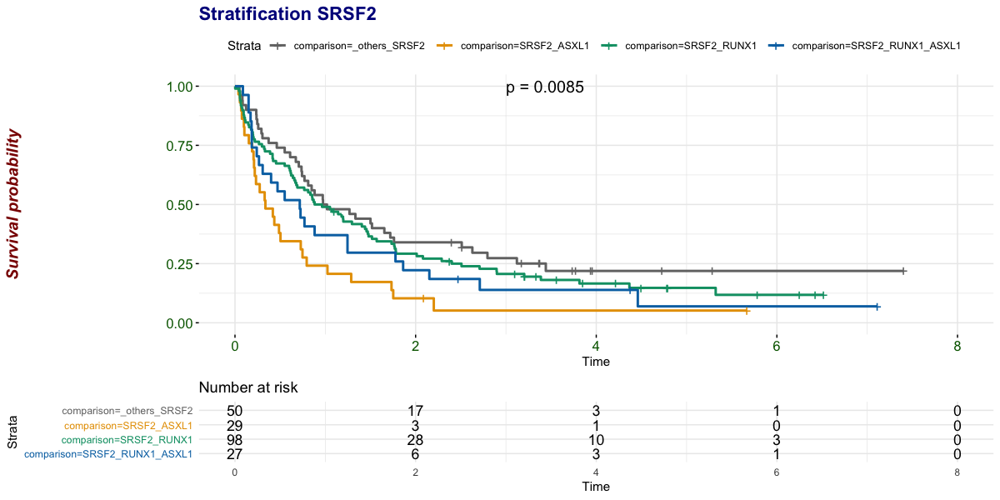

In [212]:
tmp <- df_w_correlates[df_w_correlates$comp_chr_splicing_multiple==1 & df_w_correlates$SRSF2==1,]
tmp$comparison <- 0
tmp$comparison <- ifelse(tmp$RUNX1==1 & tmp$ASXL1==1, "SRSF2_RUNX1_ASXL1",
                      ifelse(tmp$RUNX1==1,"SRSF2_RUNX1",
                          ifelse(tmp$ASXL1==1,"SRSF2_ASXL1","_others_SRSF2")))
surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(12,6)
plot_surv(fit,title="Stratification SRSF2")   

# ASXL1

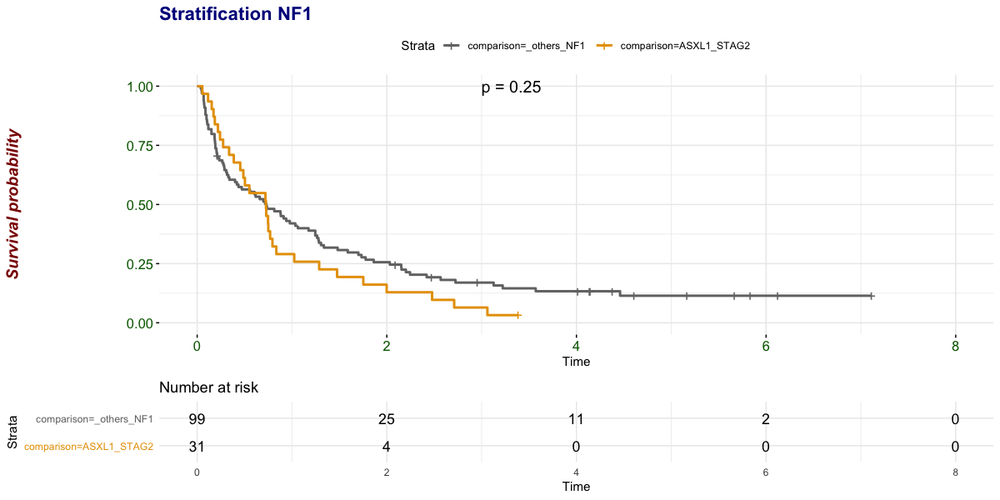

In [222]:
tmp <- df_w_correlates[df_w_correlates$comp_chr_splicing_multiple==1 & df_w_correlates$ASXL1==1,]
tmp$comparison <- 0
tmp$comparison <- ifelse(tmp$STAG2==1 , "ASXL1_STAG2","_others_ASXL1")
surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(12,6)
plot_surv(fit,title="Stratification NF1")   

# SF3B1

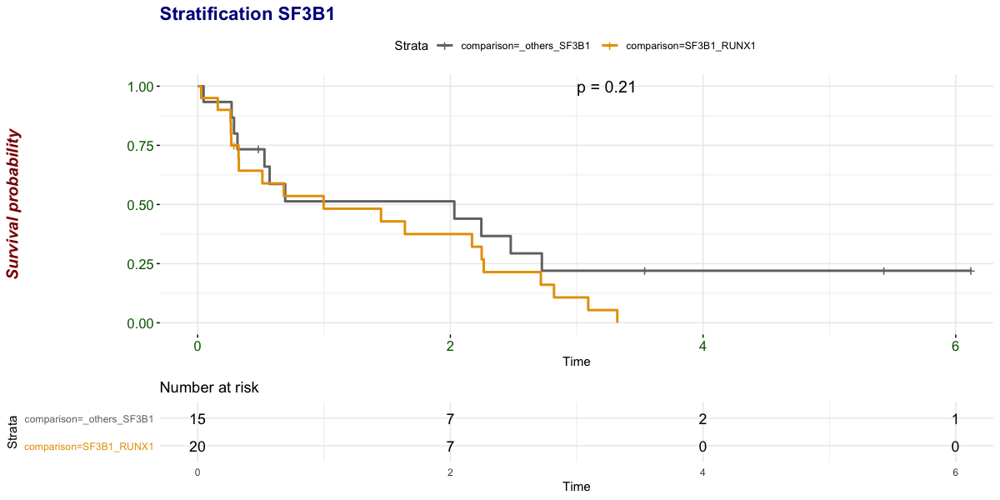

In [213]:
tmp <- df_w_correlates[df_w_correlates$comp_chr_splicing_multiple==1 & df_w_correlates$SF3B1==1,]
tmp$comparison <- 0
tmp$comparison <- ifelse(tmp$RUNX1==1, "SF3B1_RUNX1","_others_SF3B1")
surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(12,6)
plot_surv(fit,title="Stratification SF3B1")   

# U2AF1_p.Q157

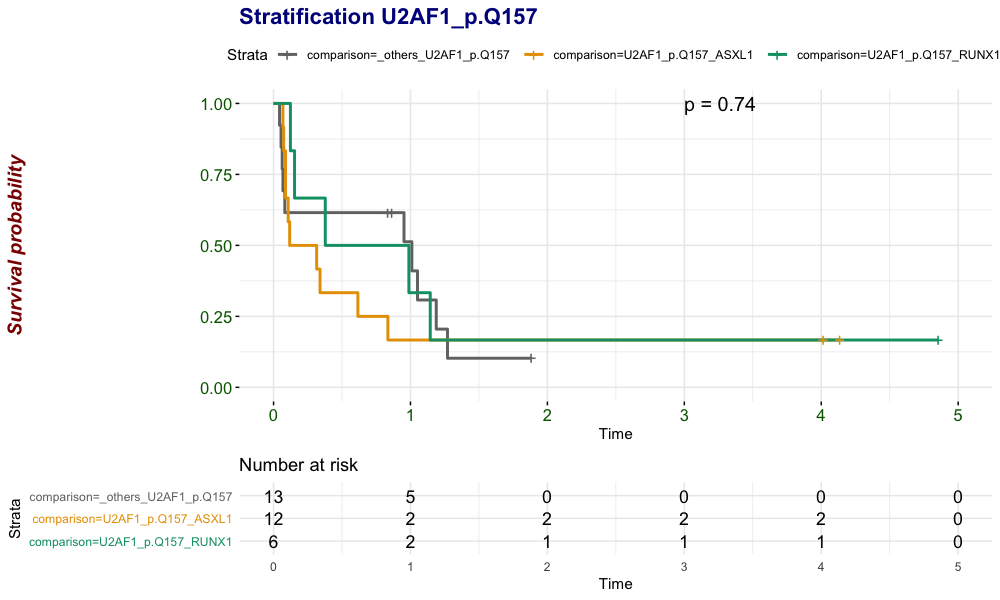

In [196]:
tmp <- df_w_correlates[df_w_correlates$comp_chr_splicing_multiple==1 & df_w_correlates$U2AF1_p.Q157==1,]
tmp$comparison <- 0
tmp$comparison <- ifelse(tmp$ASXL1==1 ,"U2AF1_p.Q157_ASXL1",
                         ifelse(tmp$RUNX1==1,"U2AF1_p.Q157_RUNX1","_others_U2AF1_p.Q157"))
surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(10,6)
plot_surv(fit,title="Stratification U2AF1_p.Q157")   

# U2AF1_p.S34

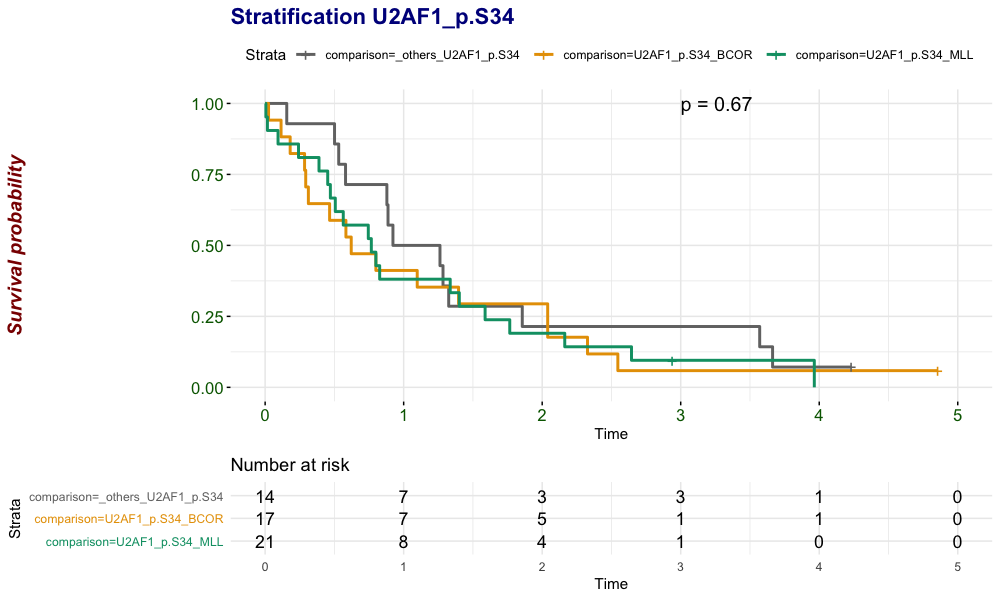

In [193]:
tmp <- df_w_correlates[df_w_correlates$comp_chr_splicing_multiple==1 & df_w_correlates$U2AF1_p.S34==1,]
tmp$comparison <- 0
tmp$comparison <- ifelse(tmp$BCOR==1 ,"U2AF1_p.S34_BCOR",
                         ifelse(tmp$MLL==1,"U2AF1_p.S34_MLL","_others_U2AF1_p.S34"))
surv_object <- Surv(time = tmp$os, event = tmp$os_status)
fit <- survfit(surv_object ~ comparison, data = tmp)
set_notebook_plot_size(10,6)
plot_surv(fit,title="Stratification U2AF1_p.S34 ")   

# MISCELLANEOUS PLOTS

In [109]:
col_list <- colnames(df_final[,startsWith(colnames(df_final),"comp_")])
df_tmp <- setNames(data.frame(matrix(ncol = length(col_list), nrow = length(col_list))), gsub("comp_","",col_list))
rownames(df_tmp) <- gsub("comp_","",col_list)
for (col in col_list){
    for (col_bis in col_list){
        df_tmp[gsub("comp_","",col),gsub("comp_","",col_bis)] <- ifelse(is.null(dim(df_final[df_final[,col]==1 & (df_final[,col_bis]==1),])[1]),0,dim(df_final[df_final[,col]==1 & (df_final[,col_bis]==1),])[1])
    }
}


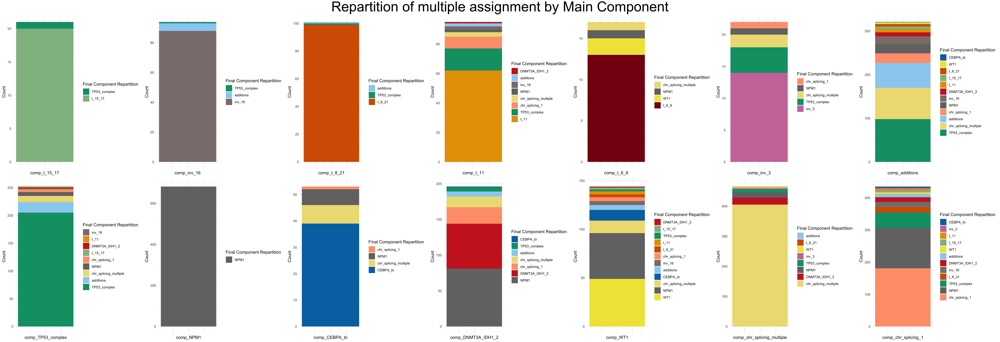

In [30]:

cols = c("NPM1"="grey45", "t_11"="#e79f00", "TP53_complex"="#009E73","CEBPA_bi"="#0072B2","inv_3"="#CC79A7",
                                      "additions"="#9ad0f3", "t_8_21"="#D55E00","no_events"="lightskyblue","inv_16"="mistyrose4", 
                                      "t_15_17"="darkseagreen","chr_splicing_multiple"="lightgoldenrod","chr_splicing_1"="lightsalmon","WT1"="#F0E442",
                                      "DNMT3A_IDH1_2"="firebrick3","not_assigned"="#000000","t_6_9"="#870C14")


set_notebook_plot_size(35,12)
plot <- list()
for (col in colnames(df_final[,c(157:170)])){

    if(dim(df_final[df_final[,col]==1,])[1]>0){
        plot[[col]] <- ggplot(df_final[df_final[,col]==1,] %>% count(!!sym(col),final_component),aes(!!sym(col),n,fill=reorder(final_component,n)))+
        geom_bar(stat="identity")+ theme(axis.text.x=element_blank(),axis.ticks.x=element_blank())+xlab(col)+ylab("Count")+
        scale_fill_manual(values=cols)+scale_y_continuous(breaks = function(x) unique(floor(pretty(seq(0, (max(x) + 1) * 1.1)))))+ labs(fill='Final Component Repartition') 
    }
}
do.call(grid.arrange, c(plot, list(ncol=7,top = textGrob("Repartition of multiple assignment by Main Component",gp=gpar(fontsize=35)))))


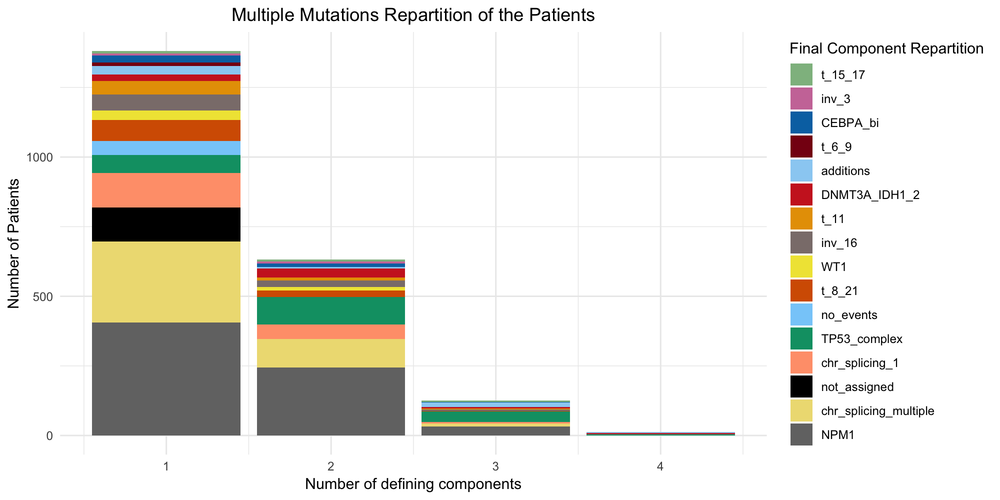

In [31]:
set_notebook_plot_size(10,5)

ggplot(df_final %>% count(num_comp_fit,final_component),aes(x=num_comp_fit,y=n,fill=reorder(final_component,n)))+geom_bar(stat="identity")+
scale_fill_manual(values=cols)+scale_y_continuous(breaks = function(x) unique(floor(pretty(seq(0, (max(x) + 1) * 1.1)))))+ labs(fill='Final Component Repartition') +
xlab("Number of defining components") + ylab("Number of Patients") +ggtitle("Multiple Mutations Repartition of the Patients")+theme(plot.title = element_text(hjust = 0.5))

NPM1 7t_11 18TP53_complex 252CEBPA_bi 0inv_3 4additions 129t_8_21 2no_events 0inv_16 5t_15_17 3chr_splicing_multiple 24chr_splicing_1 66WT1 6DNMT3A_IDH1_2 12not_assigned 0t_6_9 0